In [1]:
import numpy as np
from sklearn.model_selection import train_test_split
from pysr import PySRRegressor
from sklearn.preprocessing import label_binarize

# Sample data
X = np.random.rand(100, 10)  # 10 features
y = np.random.choice([0, 1, 2], size=100)  # Multi-class target with 3 classes

# Binarize target labels for OvA (One-vs-All) approach
y_bin = label_binarize(y, classes=[0, 1, 2])

# List to store the models for each class
models = []
predictions = []

# Train a symbolic regressor for each class
for class_index in range(y_bin.shape[1]):
    print(f"Training model for class {class_index}")
    y_class = y_bin[:, class_index]

    model = PySRRegressor(
        niterations=100,
        binary_operators=["+", "-", "*", "/", "^"],
        unary_operators=["sin", "cos", "exp", "log", "sqrt"],
        variable_names=[f"x{i}" for i in range(X.shape[1])],
        model_selection="accuracy",                    # Enable model selection mode
        population_size=1000,               # Population size for evolutionary search
        maxsize=20                          # Maximum complexity of equations
    )
    model.fit(X, y_class)
    models.append(model)
    
    # Generate predictions for this class
    predictions.append(model.predict(X))

# Combine predictions and select the class with the highest score for each sample
predictions = np.vstack(predictions).T
y_pred = np.argmax(predictions, axis=1)

# Evaluate results
accuracy = np.mean(y_pred == y)
print(f"Accuracy: {accuracy:.2f}")


Detected IPython. Loading juliacall extension. See https://juliapy.github.io/PythonCall.jl/stable/compat/#IPython
Training model for class 0
Compiling Julia backend...


c:\Users\chidi\anaconda3\envs\boot_DA\lib\site-packages\pysr\sr.py:922: FutureWarning: `variable_names` is a data-dependent parameter and should be passed when fit is called. Ignoring parameter; please pass `variable_names` during the call to fit instead.
  warnings.warn(
c:\Users\chidi\anaconda3\envs\boot_DA\lib\site-packages\pysr\sr.py:2582: UserWarning: Note: it looks like you are running in Jupyter. The progress bar will be turned off.
  warnings.warn(
c:\Users\chidi\anaconda3\envs\boot_DA\lib\site-packages\pysr\sr.py:2059: UserWarning: Note: you are running with 10 features or more. Genetic algorithms like used in PySR scale poorly with large numbers of features. You should run PySR for more `niterations` to ensure it can find the correct variables, and consider using a larger `maxsize`.
  warnings.warn(
c:\Users\chidi\anaconda3\envs\boot_DA\lib\site-packages\pysr\sr.py:73: UserWarning: You are using the `^` operator, but have not set up `constraints` for it. This may lead to over


Expressions evaluated per second: 2.050e+05
Head worker occupation: 27.9%
Progress: 15 / 1500 total iterations (1.000%)
Hall of Fame:
---------------------------------------------------------------------------------------------------
Complexity  Loss       Score     Equation
1           3.038e-01  1.594e+01  y = x₁
2           2.304e-01  2.767e-01  y = sqrt(0.12964)
4           2.256e-01  1.049e-02  y = cos(x₄) * 0.43771
5           2.213e-01  1.930e-02  y = 0.43771 * sin(exp(x₅))
6           2.171e-01  1.903e-02  y = 0.28497 ^ (sqrt(x₄) ^ x₁)
7           2.146e-01  1.177e-02  y = sqrt(x₁) / (exp(x₄) + x₆)
8           2.088e-01  2.714e-02  y = 0.44929 / sqrt(exp(sin(x₉ ^ -1.3711)))
9           2.058e-01  1.467e-02  y = 0.44929 ^ exp(x₆ * sin(x₉ ^ -1.3711))
10          2.052e-01  3.111e-03  y = sin(0.44929 ^ exp(sin((x₉ ^ -1.3711) + x₉)))
11          1.937e-01  5.733e-02  y = 0.42522 / exp(exp(sin(1.6411 / x₉)) - cos(x₄))
15          1.918e-01  2.450e-03  y = sin(0.44581 + ((sin(x₁ / x

c:\Users\chidi\anaconda3\envs\boot_DA\lib\site-packages\pysr\sr.py:922: FutureWarning: `variable_names` is a data-dependent parameter and should be passed when fit is called. Ignoring parameter; please pass `variable_names` during the call to fit instead.
  warnings.warn(
c:\Users\chidi\anaconda3\envs\boot_DA\lib\site-packages\pysr\sr.py:2582: UserWarning: Note: it looks like you are running in Jupyter. The progress bar will be turned off.
  warnings.warn(
c:\Users\chidi\anaconda3\envs\boot_DA\lib\site-packages\pysr\sr.py:2059: UserWarning: Note: you are running with 10 features or more. Genetic algorithms like used in PySR scale poorly with large numbers of features. You should run PySR for more `niterations` to ensure it can find the correct variables, and consider using a larger `maxsize`.
  warnings.warn(
c:\Users\chidi\anaconda3\envs\boot_DA\lib\site-packages\pysr\sr.py:73: UserWarning: You are using the `^` operator, but have not set up `constraints` for it. This may lead to over


Expressions evaluated per second: 1.070e+04
Head worker occupation: 0.0%
Progress: 1 / 1500 total iterations (0.067%)
Hall of Fame:
---------------------------------------------------------------------------------------------------
Complexity  Loss       Score     Equation
2           2.215e-01  7.971e+00  y = sin(0.3161)
3           2.214e-01  4.025e-04  y = sin(sin(0.36184))
4           2.193e-01  9.411e-03  y = cos(x₃) / 2.1462
5           2.159e-01  1.569e-02  y = sin(cos(x₃)) / 2.1462
7           2.148e-01  2.563e-03  y = cos(x₃) * (sin(0.86045) / 1.9842)
8           2.122e-01  1.215e-02  y = cos(x₃) * (cos(sqrt(x₁)) / 1.9842)
10          2.052e-01  1.674e-02  y = sqrt(0.36184) / (((0.52683 / x₄) + x₃) + x₈)
11          2.051e-01  3.953e-04  y = sqrt(0.36184) / ((sqrt(0.52683 / x₄) + x₃) + x₈)
12          1.951e-01  5.004e-02  y = cos(x₃) / ((x₁ + (2.5785 * (x₈ ^ x₉))) + x₃)
13          1.892e-01  3.052e-02  y = sin(cos(x₃) / ((x₁ / x₄) + ((x₈ ^ x₉) * 2.5785)))
14          1.884e

c:\Users\chidi\anaconda3\envs\boot_DA\lib\site-packages\pysr\sr.py:922: FutureWarning: `variable_names` is a data-dependent parameter and should be passed when fit is called. Ignoring parameter; please pass `variable_names` during the call to fit instead.
  warnings.warn(
c:\Users\chidi\anaconda3\envs\boot_DA\lib\site-packages\pysr\sr.py:2582: UserWarning: Note: it looks like you are running in Jupyter. The progress bar will be turned off.
  warnings.warn(
c:\Users\chidi\anaconda3\envs\boot_DA\lib\site-packages\pysr\sr.py:2059: UserWarning: Note: you are running with 10 features or more. Genetic algorithms like used in PySR scale poorly with large numbers of features. You should run PySR for more `niterations` to ensure it can find the correct variables, and consider using a larger `maxsize`.
  warnings.warn(
c:\Users\chidi\anaconda3\envs\boot_DA\lib\site-packages\pysr\sr.py:73: UserWarning: You are using the `^` operator, but have not set up `constraints` for it. This may lead to over


Expressions evaluated per second: 0.000e+00
Head worker occupation: 50.8%. This is high, and will prevent efficient resource usage. Increase `ncycles_per_iteration` to reduce load on head worker.
Progress: 3 / 1500 total iterations (0.200%)
Hall of Fame:
---------------------------------------------------------------------------------------------------
Complexity  Loss       Score     Equation
1           3.305e-01  1.594e+01  y = x₄
2           2.141e-01  4.343e-01  y = sin(0.3023)
3           2.139e-01  7.051e-04  y = 0.11727 + 0.19273
4           2.104e-01  1.663e-02  y = sqrt(x₈) * 0.41671
5           2.061e-01  2.031e-02  y = exp(x₃) * exp(-1.7741)
6           2.007e-01  2.658e-02  y = sin(0.12606 + (x₃ * x₈))
7           1.983e-01  1.214e-02  y = sin(sin((x₈ * x₃) + 0.12606))
8           1.974e-01  4.465e-03  y = sin(sin(sin((x₈ * x₃) + 0.12606)))
9           1.913e-01  3.171e-02  y = (x₃ + x₈) / exp(sqrt(x₁) + x₀)
10          1.834e-01  4.174e-02  y = ((x₈ * x₅) ^ x₅) / exp(x₁ 

In [4]:
y_pred

array([0, 1, 0, 2, 0, 2, 0, 0, 2, 1, 0, 0, 1, 0, 1, 1, 2, 1, 0, 0, 2, 1,
       1, 2, 1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 1, 2, 2, 0, 0, 2, 0, 0, 1,
       0, 2, 2, 0, 0, 2, 0, 1, 1, 2, 1, 0, 1, 2, 2, 0, 2, 1, 0, 1, 1, 1,
       0, 2, 1, 1, 1, 0, 1, 0, 0, 1, 2, 1, 2, 0, 0, 1, 2, 0, 2, 0, 0, 2,
       0, 0, 2, 0, 1, 2, 1, 1, 1, 2, 0, 0])

In [3]:
y_class

array([0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0,
       0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0,
       0, 1, 1, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0, 0,
       0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 1,
       0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0])

In [5]:
y_class

array([0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0,
       0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0,
       0, 1, 1, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0, 0,
       0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 1,
       0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0])

In [6]:
model.equations_

,complexity,loss,score,equation,sympy_format,lambda_format
0,1,0.213900,0.000000,0.31000024,0.310000240000000,PySRFunction(X=>0.310000240000000)
1,3,0.211143,0.006487,0.6003454 * x8,0.6003454*x8,PySRFunction(X=>0.6003454*x8)
2,4,0.203390,0.037408,1.1791896 - cos(x8),1.1791896 - cos(x8),PySRFunction(X=>1.1791896 - cos(x8))
3,5,0.199739,0.018115,0.3330249 * (x3 + x8),0.3330249*(x3 + x8),PySRFunction(X=>0.3330249*(x3 + x8))
4,6,0.192647,0.036152,(x5 * x8) ^ sqrt(x5),(x5*x8)**(sqrt(x5)),PySRFunction(X=>(x5*x8)**(sqrt(x5)))
5,7,0.180986,0.062440,(x8 * (x5 ^ 3.184885)) ^ x5,(x5**3.184885*x8)**x5,PySRFunction(X=>(x5**3.184885*x8)**x5)
6,8,0.180188,0.004420,((x5 ^ 3.352795) * x8) ^ sin(x5),(x5**3.352795*x8)**sin(x5),PySRFunction(X=>(x5**3.352795*x8)**sin(x5))
7,9,0.172814,0.041783,(x8 * x5) ^ (x5 ^ (0.058008477 / x5)),(x5*x8)**(x5**(0.058008477/x5)),PySRFunction(X=>(x5*x8)**(x5**(0.058008477/x5)))
8,10,0.169741,0.017942,(x5 * x8) ^ (x5 ^ cos(10.339223 * x5)),(x5*x8)**(x5**cos(10.339223*x5)),PySRFunction(X=>(x5*x8)**(x5**cos(10.339223*x5)))
9,11,0.157022,0.077892,0.19335023 / ((x1 / x3) ^ cos(cos(x3) / x5)),0.19335023/((x1/x3)**cos(cos(x3)/x5)),PySRFunction(X=>0.19335023/((x1/x3)**cos(cos(x...


In [7]:
import matplotlib.pyplot as plt

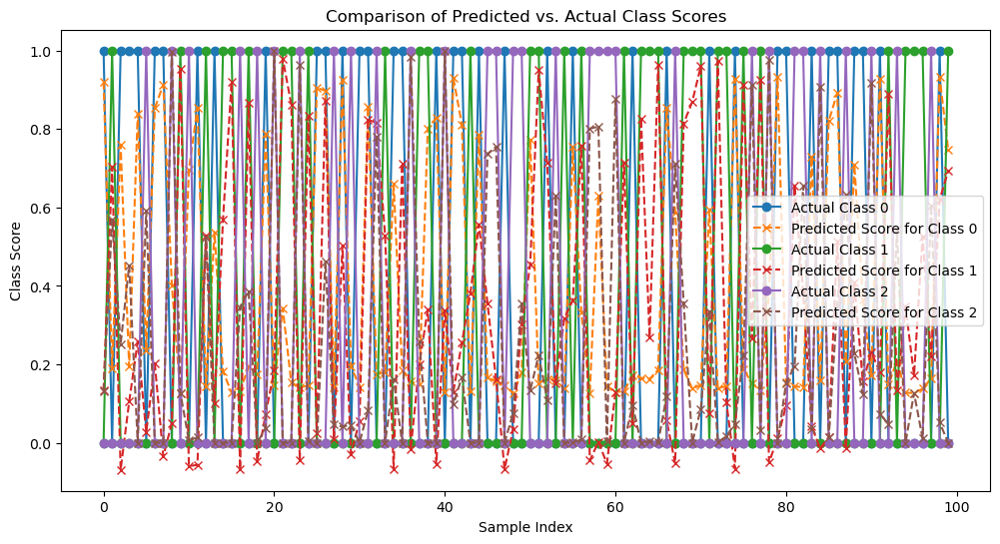

In [8]:
# Plot visual comparison between y_class and predictions for each class
plt.figure(figsize=(12, 6))
for class_index in range(y_bin.shape[1]):
    plt.plot(y_bin[:, class_index], label=f'Actual Class {class_index}', linestyle='-', marker='o')
    plt.plot(predictions[:, class_index], label=f'Predicted Score for Class {class_index}', linestyle='--', marker='x')

plt.xlabel('Sample Index')
plt.ylabel('Class Score')
plt.title('Comparison of Predicted vs. Actual Class Scores')
plt.legend()
plt.show()

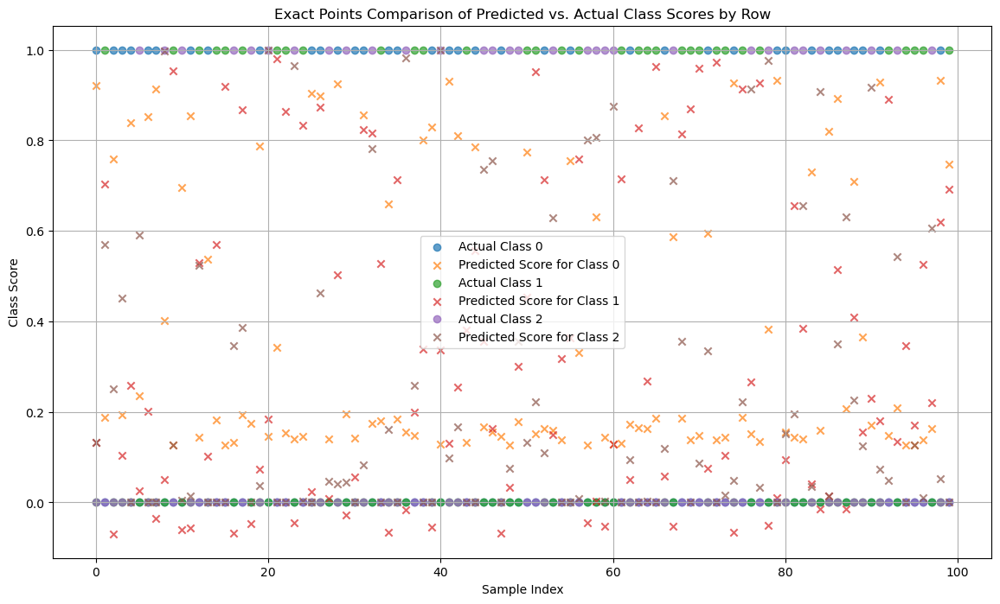

In [9]:
# Visual comparison using scatter plot for exact points at each row
plt.figure(figsize=(14, 8))

for class_index in range(y_bin.shape[1]):
    plt.scatter(
        np.arange(len(y_bin[:, class_index])),  # Row index on x-axis
        y_bin[:, class_index], 
        label=f'Actual Class {class_index}',
        marker='o',
        alpha=0.7
    )
    plt.scatter(
        np.arange(len(predictions[:, class_index])),
        predictions[:, class_index],
        label=f'Predicted Score for Class {class_index}',
        marker='x',
        alpha=0.7
    )

plt.xlabel('Sample Index')
plt.ylabel('Class Score')
plt.title('Exact Points Comparison of Predicted vs. Actual Class Scores by Row')
plt.legend()
plt.grid(True)
plt.show()

In [13]:
import numpy as np
from pysr import PySRRegressor
from sklearn.metrics import accuracy_score
from sklearn.preprocessing import LabelEncoder

# Sample data
X = np.random.rand(100, 10)
y = np.random.choice(['class_A', 'class_B', 'class_C', 'class_D', 'class_E', 'class_F'], size=100)  # Categorical target

# Encode the target labels
le = LabelEncoder()
y_encoded = le.fit_transform(y)

# Train the symbolic regression model

model = PySRRegressor(
    niterations=1000,  # Number of iterations (adjust as necessary)
    
    # List of binary operators (two inputs)
    binary_operators=[
        "+",    # Addition
        "-",    # Subtraction
        "*",    # Multiplication
        "/",    # Division
        "^",    # Power (alternative to **)
        "%",    # Modulo (remainder after division)
        "max",  # Maximum of two values
        "min",  # Minimum of two values
    ],
    
    # List of unary operators (one input)
    unary_operators=[
        "sin",      # Sine function
        "cos",      # Cosine function
        "tan",      # Tangent function
        "exp",      # Exponential function (e^x)
        "log",      # Natural logarithm (ln(x))
        "abs",      # Absolute value
        "sqrt",     # Square root
        "sign",     # Sign function (+1, 0, -1)
        "inv",      # Inverse (1/x)
        "square",   # Square of the value (x**2)
        "cube",     # Cube of the value (x**3)
    ],
    
    # Define any custom operators (optional)
    extra_sympy_mappings={"inv": lambda x: 1/x},  # Example of a custom operator
    variable_names=[f"x{i}" for i in range(X.shape[1])],
    model_selection=accuracy,                    # Enable model selection mode
    population_size=1000,               # Population size for evolutionary search
    maxsize=20                          # Maximum complexity of equations
)
    


model.fit(X, y_encoded)



c:\Users\chidi\anaconda3\envs\boot_DA\lib\site-packages\pysr\sr.py:922: FutureWarning: `variable_names` is a data-dependent parameter and should be passed when fit is called. Ignoring parameter; please pass `variable_names` during the call to fit instead.
  warnings.warn(
c:\Users\chidi\anaconda3\envs\boot_DA\lib\site-packages\pysr\sr.py:2582: UserWarning: Note: it looks like you are running in Jupyter. The progress bar will be turned off.
  warnings.warn(
c:\Users\chidi\anaconda3\envs\boot_DA\lib\site-packages\pysr\sr.py:2059: UserWarning: Note: you are running with 10 features or more. Genetic algorithms like used in PySR scale poorly with large numbers of features. You should run PySR for more `niterations` to ensure it can find the correct variables, and consider using a larger `maxsize`.
  warnings.warn(
c:\Users\chidi\anaconda3\envs\boot_DA\lib\site-packages\pysr\sr.py:73: UserWarning: You are using the `^` operator, but have not set up `constraints` for it. This may lead to over


Expressions evaluated per second: 1.210e+04
Head worker occupation: 35.2%
Progress: 15 / 15000 total iterations (0.100%)
Hall of Fame:
---------------------------------------------------------------------------------------------------
Complexity  Loss       Score     Equation
1           3.095e+00  1.594e+01  y = 1.8989
2           2.824e+00  9.182e-02  y = abs(2.4202)
3           2.728e+00  3.460e-02  y = 1.9315 + x₂
4           2.708e+00  7.336e-03  y = exp(x₈) + x₂
5           2.634e+00  2.742e-02  y = rem(x₄, x₈) - -2.106
6           2.585e+00  1.892e-02  y = exp(max(x₈, x₂)) + x₄
7           2.538e+00  1.818e-02  y = tan(tan(rem(x₄, x₈))) - -2.106
8           2.507e+00  1.260e-02  y = exp(max(x₈, x₂)) + min(x₇, x₄)
9           2.408e+00  4.027e-02  y = tan(tan(rem(x₄ ^ 0.63469, x₈))) - -2.106
11          2.389e+00  3.994e-03  y = abs(exp(max(x₈, x₂)) + min(sin(inv(x₇)), x₄))
12          2.303e+00  3.669e-02  y = abs(exp(max(x₈, x₂)) + sin(sin(inv(x₇)) / x₄))
13          2.298e+00

PolynomialError: Piecewise generators do not make sense

In [14]:

# Make predictions and map them back to the original classes
y_pred_encoded = np.round(model.predict(X)).astype(int)  # Round to nearest class index
y_pred_encoded = np.clip(y_pred_encoded, 0, len(le.classes_) - 1)  # Ensure valid index range
y_pred = le.inverse_transform(y_pred_encoded)  # Map back to original classes

# Calculate accuracy
accuracy = accuracy_score(y, y_pred)
print(f"Accuracy: {accuracy:.2f}")

AttributeError: 'NoneType' object has no attribute 'loc'

In [11]:
y_pred

array(['class_D', 'class_D', 'class_D', 'class_D', 'class_D', 'class_D',
       'class_D', 'class_D', 'class_D', 'class_D', 'class_D', 'class_D',
       'class_D', 'class_D', 'class_D', 'class_D', 'class_D', 'class_D',
       'class_D', 'class_D', 'class_D', 'class_D', 'class_D', 'class_D',
       'class_D', 'class_D', 'class_D', 'class_D', 'class_D', 'class_D',
       'class_D', 'class_D', 'class_D', 'class_D', 'class_D', 'class_D',
       'class_D', 'class_D', 'class_D', 'class_D', 'class_D', 'class_D',
       'class_D', 'class_D', 'class_D', 'class_D', 'class_D', 'class_D',
       'class_D', 'class_D', 'class_D', 'class_D', 'class_D', 'class_D',
       'class_D', 'class_D', 'class_D', 'class_D', 'class_D', 'class_D',
       'class_D', 'class_D', 'class_D', 'class_D', 'class_D', 'class_D',
       'class_D', 'class_D', 'class_D', 'class_D', 'class_D', 'class_D',
       'class_D', 'class_D', 'class_D', 'class_D', 'class_D', 'class_D',
       'class_D', 'class_D', 'class_D', 'class_D', 

In [12]:
y

array(['class_F', 'class_B', 'class_C', 'class_E', 'class_D', 'class_C',
       'class_A', 'class_B', 'class_C', 'class_D', 'class_D', 'class_C',
       'class_F', 'class_B', 'class_E', 'class_B', 'class_F', 'class_F',
       'class_B', 'class_E', 'class_F', 'class_F', 'class_D', 'class_B',
       'class_A', 'class_C', 'class_A', 'class_C', 'class_E', 'class_B',
       'class_D', 'class_A', 'class_B', 'class_E', 'class_A', 'class_F',
       'class_C', 'class_F', 'class_F', 'class_D', 'class_E', 'class_C',
       'class_C', 'class_D', 'class_C', 'class_F', 'class_B', 'class_A',
       'class_A', 'class_C', 'class_F', 'class_D', 'class_E', 'class_D',
       'class_C', 'class_F', 'class_A', 'class_B', 'class_D', 'class_E',
       'class_E', 'class_C', 'class_D', 'class_F', 'class_F', 'class_B',
       'class_F', 'class_E', 'class_C', 'class_C', 'class_F', 'class_F',
       'class_C', 'class_B', 'class_E', 'class_B', 'class_D', 'class_B',
       'class_A', 'class_A', 'class_D', 'class_C', 

In [18]:
import numpy as np
import pandas as pd

# Sample data
X = np.random.rand(100, 10)
y = np.random.choice(['class_A', 'class_B', 'class_C', 'class_D', 'class_E', 'class_F'], size=100)  # Categorical target

# Convert X to a DataFrame with named columns
df_X = pd.DataFrame(X, columns=[f"x{i}" for i in range(X.shape[1])])

# Add the target column to the DataFrame
df_X['target'] = y

# Display the resulting DataFrame
df_X.head()


,x0,x1,x2,x3,x4,x5,x6,x7,x8,x9,target
0,0.605574,0.168795,0.907960,0.367325,0.071922,0.591773,0.779045,0.253060,0.491522,0.697246,class_F
1,0.204047,0.317397,0.127271,0.526980,0.098921,0.233387,0.486479,0.881099,0.021351,0.109255,class_A
2,0.017961,0.110260,0.606806,0.682621,0.665181,0.335036,0.651354,0.960964,0.356771,0.885319,class_C
3,0.979234,0.165331,0.315858,0.872490,0.875013,0.676000,0.891636,0.739201,0.474102,0.765073,class_F
4,0.273245,0.567960,0.053631,0.347154,0.189307,0.979160,0.983890,0.105093,0.610332,0.058289,class_A


In [19]:
import numpy as np
from pysr import PySRRegressor
from sklearn.metrics import accuracy_score
from sklearn.preprocessing import LabelEncoder

# Sample data
X = df_X.drop(columns='target')
y = df_X['target']  # Categorical target

# Encode the target labels
le = LabelEncoder()
y_encoded = le.fit_transform(y)

# Initialize PySRRegressor with basic operators only
model = PySRRegressor(
    niterations=100,
    binary_operators=["+", "-", "*", "/"],  # Avoid advanced functions
    variable_names=[f"x{i}" for i in range(X.shape[1])],
    maxsize=20,  # Restrict equation complexity
    model_selection="best"
)

# Fit the model on encoded targets
try:
    model.fit(X, y_encoded)
except Exception as e:
    print("Error during fitting:", e)

# Make predictions and map them back to the original classes
y_pred_encoded = np.round(model.predict(X)).astype(int)  # Round to nearest class index
y_pred_encoded = np.clip(y_pred_encoded, 0, len(le.classes_) - 1)  # Ensure valid index range
y_pred = le.inverse_transform(y_pred_encoded)  # Map back to original classes

# Calculate accuracy
accuracy = accuracy_score(y, y_pred)
print(f"Accuracy: {accuracy:.2f}")

# Display the best symbolic expression found
print("Best symbolic expression:", model.get_best())


c:\Users\chidi\anaconda3\envs\boot_DA\lib\site-packages\pysr\sr.py:922: FutureWarning: `variable_names` is a data-dependent parameter and should be passed when fit is called. Ignoring parameter; please pass `variable_names` during the call to fit instead.
  warnings.warn(
c:\Users\chidi\anaconda3\envs\boot_DA\lib\site-packages\pysr\sr.py:2582: UserWarning: Note: it looks like you are running in Jupyter. The progress bar will be turned off.
  warnings.warn(
c:\Users\chidi\anaconda3\envs\boot_DA\lib\site-packages\pysr\sr.py:2059: UserWarning: Note: you are running with 10 features or more. Genetic algorithms like used in PySR scale poorly with large numbers of features. You should run PySR for more `niterations` to ensure it can find the correct variables, and consider using a larger `maxsize`.
  warnings.warn(
[ Info: Started!



Expressions evaluated per second: 3.010e+05
Head worker occupation: 31.1%
Progress: 655 / 1500 total iterations (43.667%)
Hall of Fame:
---------------------------------------------------------------------------------------------------
Complexity  Loss       Score     Equation
1           3.570e+00  1.594e+01  y = 2.4902
3           3.507e+00  8.853e-03  y = 2.9924 - x2
5           3.472e+00  5.109e-03  y = (2.4947 + x3) - x2
7           3.415e+00  8.157e-03  y = 2.953 + (x6 - (x2 + x4))
9           3.369e+00  6.835e-03  y = (x8 * ((x3 - x2) * 2.0813)) - -2.514
11          3.355e+00  2.143e-03  y = (x8 * ((x2 - x3) * (-1.5572 - x4))) - -2.4895
13          3.308e+00  6.951e-03  y = ((x8 * (((x2 - x7) - x3) * -2.3045)) - x7) - -2.4895
15          3.267e+00  6.260e-03  y = (x8 * ((x3 - x4) * (-3.1288 * ((x9 - x0) - x2)))) - -2.410...
                                  1
17          3.232e+00  5.470e-03  y = (x8 * ((x3 - x4) * ((-3.1288 * ((x9 - x0) - x2)) + x5))) -...
                    

In [21]:
y

0     class_F
1     class_A
2     class_C
3     class_F
4     class_A
       ...   
95    class_F
96    class_C
97    class_D
98    class_E
99    class_C
Name: target, Length: 100, dtype: object

In [20]:
y_pred

array(['class_D', 'class_D', 'class_C', 'class_D', 'class_D', 'class_D',
       'class_C', 'class_C', 'class_D', 'class_D', 'class_E', 'class_C',
       'class_C', 'class_D', 'class_D', 'class_D', 'class_C', 'class_D',
       'class_C', 'class_B', 'class_C', 'class_C', 'class_D', 'class_D',
       'class_D', 'class_C', 'class_E', 'class_C', 'class_C', 'class_C',
       'class_C', 'class_D', 'class_D', 'class_E', 'class_C', 'class_B',
       'class_D', 'class_C', 'class_D', 'class_C', 'class_D', 'class_E',
       'class_D', 'class_C', 'class_C', 'class_C', 'class_D', 'class_E',
       'class_D', 'class_B', 'class_C', 'class_D', 'class_D', 'class_D',
       'class_D', 'class_C', 'class_D', 'class_D', 'class_D', 'class_C',
       'class_C', 'class_C', 'class_C', 'class_C', 'class_D', 'class_D',
       'class_D', 'class_C', 'class_C', 'class_C', 'class_C', 'class_C',
       'class_C', 'class_D', 'class_D', 'class_D', 'class_D', 'class_C',
       'class_D', 'class_E', 'class_D', 'class_D', 

In [24]:
from gplearn.genetic import SymbolicRegressor
from sklearn.preprocessing import LabelBinarizer
from sklearn.metrics import accuracy_score

# Generating synthetic multiclass data
X = np.random.rand(100, 2)
y = np.random.choice(['class_A', 'class_B', 'class_C'], size=100)

# Convert y to one-vs-rest binary format
lb = LabelBinarizer()
y_bin = lb.fit_transform(y)

# Fit one model per class in a one-vs-rest fashion
models = {}
predictions = np.zeros_like(y_bin)

for idx, class_name in enumerate(lb.classes_):
    print(f"Training model for class {class_name}")
    
    # Initialize and train symbolic regressor for each class
    model = SymbolicRegressor(
        population_size=1000,
        generations=20,
        stopping_criteria=0.01,
        function_set=['add', 'sub', 'mul', 'div', 'sin', 'cos'],
        parsimony_coefficient=0.01,
        random_state=0
    )
    model.fit(X, y_bin[:, idx])
    models[class_name] = model
    
    # Store continuous predictions for thresholding
    predictions[:, idx] = model.predict(X)

# Convert continuous predictions to class labels
predicted_classes = lb.classes_[predictions.argmax(axis=1)]

# Measure accuracy
accuracy = accuracy_score(y, predicted_classes)
print(f"Multiclass Classification Accuracy: {accuracy}")


Training model for class class_A
Training model for class class_B
Training model for class class_C
Multiclass Classification Accuracy: 0.26


In [31]:
predicted_classes 


array(['class_A', 'class_A', 'class_A', 'class_A', 'class_A', 'class_A',
       'class_A', 'class_A', 'class_A', 'class_A', 'class_A', 'class_A',
       'class_A', 'class_A', 'class_A', 'class_A', 'class_A', 'class_A',
       'class_A', 'class_A', 'class_A', 'class_A', 'class_A', 'class_A',
       'class_A', 'class_A', 'class_A', 'class_A', 'class_A', 'class_A',
       'class_A', 'class_A', 'class_A', 'class_A', 'class_A', 'class_A',
       'class_A', 'class_A', 'class_A', 'class_A', 'class_A', 'class_A',
       'class_A', 'class_A', 'class_A', 'class_A', 'class_A', 'class_A',
       'class_A', 'class_A', 'class_A', 'class_A', 'class_A', 'class_A',
       'class_A', 'class_A', 'class_A', 'class_A', 'class_A', 'class_A',
       'class_A', 'class_A', 'class_A', 'class_A', 'class_A', 'class_A',
       'class_A', 'class_A', 'class_A', 'class_A', 'class_A', 'class_A',
       'class_A', 'class_A', 'class_A', 'class_A', 'class_A', 'class_A',
       'class_A', 'class_A', 'class_A', 'class_A', 

In [33]:
y_bin

array([[1, 0, 0],
       [1, 0, 0],
       [0, 1, 0],
       [1, 0, 0],
       [0, 1, 0],
       [0, 1, 0],
       [0, 1, 0],
       [1, 0, 0],
       [0, 1, 0],
       [0, 1, 0],
       [0, 0, 1],
       [0, 0, 1],
       [0, 0, 1],
       [0, 0, 1],
       [1, 0, 0],
       [0, 1, 0],
       [1, 0, 0],
       [1, 0, 0],
       [0, 1, 0],
       [0, 1, 0],
       [0, 1, 0],
       [0, 1, 0],
       [0, 0, 1],
       [0, 0, 1],
       [0, 1, 0],
       [1, 0, 0],
       [0, 0, 1],
       [0, 0, 1],
       [0, 0, 1],
       [0, 1, 0],
       [1, 0, 0],
       [0, 1, 0],
       [0, 1, 0],
       [0, 1, 0],
       [0, 0, 1],
       [1, 0, 0],
       [0, 0, 1],
       [0, 0, 1],
       [0, 0, 1],
       [0, 1, 0],
       [1, 0, 0],
       [0, 1, 0],
       [0, 1, 0],
       [0, 1, 0],
       [0, 1, 0],
       [0, 1, 0],
       [0, 0, 1],
       [0, 1, 0],
       [0, 1, 0],
       [0, 0, 1],
       [0, 1, 0],
       [0, 0, 1],
       [1, 0, 0],
       [1, 0, 0],
       [0, 0, 1],
       [0,

In [25]:
model

SymbolicRegressor(function_set=['add', 'sub', 'mul', 'div', 'sin', 'cos'],
                  parsimony_coefficient=0.01, random_state=0,
                  stopping_criteria=0.01)

In [29]:
import numpy as np
from gplearn.genetic import SymbolicRegressor

# Generate synthetic data
X = np.random.rand(100, 10) 
y = np.random.rand(100)

# Initialize and fit Symbolic Regressor
model = SymbolicRegressor(
    population_size=1500,
    generations=30,
    stopping_criteria=0.05,
    function_set=['add', 'sub', 'mul', 'div', 'sqrt', 'log', 'sin', 'cos'],
    parsimony_coefficient=0.01,
    p_crossover=0.8,
    p_subtree_mutation=0.02,
    p_hoist_mutation=0.02,
    p_point_mutation=0.03,
    init_depth=(2, 5),
    init_method='half and half',
    metric='mse',
    random_state=42
)

# Train the model
model.fit(X, y)

# Display the best equation discovered
print("Best Equation Discovered:")
print(model)

# Display all discovered programs (equations)
print("\nAll Discovered Programs:")
for program in model._programs:
    print(program)

# Display the best program in more detail
print("\nBest Program:")
print(model._best)


Best Equation Discovered:
sqrt(0.297)

All Discovered Programs:
[None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, <gplearn._program._Program object at 0x0000023494431120>, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, <gplearn._program._Program object at 0x0000023494431D50>, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, <gplearn._program._Program object at 0x000002349443

AttributeError: 'SymbolicRegressor' object has no attribute '_best'

In [30]:
# Access the best program (equation) discovered
print("Best Program:")
print(model._program)

# Access the Hall of Fame to see all discovered programs
print("\nHall of Fame:")
for i, program in enumerate(model.hall_of_fame):
    print(f"Program {i + 1}:")
    print(program)


Best Program:
sqrt(0.297)

Hall of Fame:


TypeError: 'NoneType' object is not iterable

### TRYING A DATASET WITH KNOWN GOVERNING LAW

In [2]:
import numpy as np
import pandas as pd

# Set the random seed for reproducibility
np.random.seed(42)

# Step 1: Create a dataset X with random integers
# Generate 100 samples and 6 features
X = np.random.randint(1, 100, size=(100, 6))  # Random integers between 1 and 99

# Step 2: Calculate the target variable y using the given formula
# Extracting individual columns for clarity
x0 = X[:, 0]  # First column
x1 = X[:, 1]  # Second column
x2 = X[:, 2]  # Third column
x3 = X[:, 3]  # Fourth column
x4 = X[:, 4]  # Fifth column
x5 = X[:, 5]  # Sixth column

# Compute y using the provided formula
y = (((x0 * x5)**0.2) / (x1 + x3)) * (np.log(x2) / np.sqrt(x4))


# Step 3: Convert to DataFrame (optional)
df = pd.DataFrame(X, columns=[f'x{i}' for i in range(X.shape[1])])
df['y'] = y

# Display the first few rows of the dataset
df.head()


,x0,x1,x2,x3,x4,x5,y
0,52,93,15,72,61,21,0.008514
1,83,87,75,75,88,24,0.012982
2,3,22,53,2,88,30,0.043373
3,38,2,64,60,21,33,0.060973
4,76,58,22,89,49,91,0.017606


In [3]:
y

array([0.00851437, 0.01298173, 0.04337289, 0.06097262, 0.017606  ,
       0.01925545, 0.02212185, 0.46492743, 0.00589976, 0.01805099,
       0.03226567, 0.03755202, 0.00436203, 0.01443671, 0.01680472,
       0.01654622, 0.017307  , 0.02320014, 0.        , 0.00985   ,
       0.02636875, 0.03336348, 0.03692049, 0.01178337, 0.07073057,
       0.04732748, 0.05846504, 0.04455093, 0.02269123, 0.06792885,
       0.0351156 , 0.10596586, 0.00388698, 0.010519  , 0.01733318,
       0.04715107, 0.0082321 , 0.0065228 , 0.00356956, 0.01606117,
       0.05977061, 0.01316826, 0.06387092, 0.01162829, 0.01908895,
       0.        , 0.02069116, 0.01062603, 0.00698318, 0.00432925,
       0.06167371, 0.01758567, 0.06745401, 0.03185616, 0.0298636 ,
       0.10026106, 0.04941489, 0.02713558, 0.04525264, 0.11489713,
       0.01440664, 0.0094962 , 0.01588959, 0.0251893 , 0.02024554,
       0.033584  , 0.01685664, 0.05264034, 0.04821757, 0.00991327,
       0.02970068, 0.02406543, 0.04300299, 0.01887894, 0.03825

In [4]:
X

array([[52, 93, 15, 72, 61, 21],
       [83, 87, 75, 75, 88, 24],
       [ 3, 22, 53,  2, 88, 30],
       [38,  2, 64, 60, 21, 33],
       [76, 58, 22, 89, 49, 91],
       [59, 42, 92, 60, 80, 15],
       [62, 62, 47, 62, 51, 55],
       [64,  3, 51,  7, 21, 73],
       [39, 18,  4, 89, 60, 14],
       [ 9, 90, 53,  2, 84, 92],
       [60, 71, 44,  8, 47, 35],
       [78, 81, 36, 50,  4,  2],
       [ 6, 54,  4, 54, 93, 63],
       [18, 90, 44, 34, 74, 62],
       [14, 95, 48, 15, 72, 78],
       [87, 62, 40, 85, 80, 82],
       [53, 24, 26, 89, 60, 41],
       [29, 15, 45, 65, 89, 71],
       [ 9, 88,  1,  8, 88, 63],
       [11, 81,  8, 35, 35, 33],
       [ 5, 41, 28,  7, 73, 72],
       [12, 34, 33, 48, 23, 62],
       [88, 37, 99, 44, 86, 91],
       [35, 65, 99, 47, 78,  3],
       [ 1,  5, 90, 14, 27,  9],
       [79, 15, 90, 42, 77, 51],
       [63, 96, 52, 96,  4, 94],
       [23, 15, 43, 29, 36, 13],
       [32, 71, 59, 86, 28, 66],
       [42, 45, 62, 57,  6, 28],
       [28

In [38]:
# Train the symbolic regression model

model = PySRRegressor(
    niterations=1000,  # Number of iterations (adjust as necessary)
    
    # List of binary operators (two inputs)
    binary_operators=[
        "+",    # Addition
        "-",    # Subtraction
        "*",    # Multiplication
        "/",    # Division
        "^",    # Power (alternative to **)
        "%",    # Modulo (remainder after division)
        "max",  # Maximum of two values
        "min",  # Minimum of two values
    ],
    
    # List of unary operators (one input)
    unary_operators=[
        "sin",      # Sine function
        "cos",      # Cosine function
        "tan",      # Tangent function
        "exp",      # Exponential function (e^x)
        "log",      # Natural logarithm (ln(x))
        "abs",      # Absolute value
        "sqrt",     # Square root
        "sign",     # Sign function (+1, 0, -1)
        "inv",      # Inverse (1/x)
        "square",   # Square of the value (x**2)
        "cube",     # Cube of the value (x**3)
    ],
    
    # Define any custom operators (optional)
    extra_sympy_mappings={"inv": lambda x: 1/x},  # Example of a custom operator
    variable_names=[f"x{i}" for i in range(X.shape[1])],
    model_selection=accuracy,                    # Enable model selection mode
    population_size=1000,               # Population size for evolutionary search
    maxsize=20                          # Maximum complexity of equations
)


c:\Users\chidi\anaconda3\envs\boot_DA\lib\site-packages\pysr\sr.py:922: FutureWarning: `variable_names` is a data-dependent parameter and should be passed when fit is called. Ignoring parameter; please pass `variable_names` during the call to fit instead.
  warnings.warn(


In [39]:
model.fit(X,y)

c:\Users\chidi\anaconda3\envs\boot_DA\lib\site-packages\pysr\sr.py:2582: UserWarning: Note: it looks like you are running in Jupyter. The progress bar will be turned off.
  warnings.warn(
c:\Users\chidi\anaconda3\envs\boot_DA\lib\site-packages\pysr\sr.py:73: UserWarning: You are using the `^` operator, but have not set up `constraints` for it. This may lead to overly complex expressions. One typical constraint is to use `constraints={..., '^': (-1, 1)}`, which will allow arbitrary-complexity base (-1) but only powers such as a constant or variable (1). For more tips, please see https://astroautomata.com/PySR/tuning/
  warnings.warn(
[ Info: Started!



Expressions evaluated per second: 0.000e+00
Head worker occupation: 14.7%
Progress: 11 / 15000 total iterations (0.073%)
Hall of Fame:
---------------------------------------------------------------------------------------------------
Complexity  Loss       Score     Equation
2           6.166e-03  7.971e+00  y = inv(x₁)
3           4.779e-03  2.549e-01  y = square(inv(x₁))
4           3.156e-03  4.149e-01  y = tan(inv(square(x₁)))
5           1.115e-03  1.041e+00  y = 1.4664 / max(x₃, x₁)
7           4.865e-04  4.146e-01  y = 1.4243 / max(x₃ + -3.7668, x₁)
8           4.834e-04  6.498e-03  y = abs(1.4248 / max(x₃ + -3.8911, x₁))
9           4.460e-04  8.033e-02  y = 1.4406 / max(x₁, x₃ + (-0.13988 * x₀))
10          4.423e-04  8.361e-03  y = 1.4406 / max(x₃ + (1.4136 - sqrt(x₀)), x₁)
11          4.350e-04  1.677e-02  y = rem(1.4406, x₀) / max(x₃ + (-3.1414 - 1.9911), x₁)
12          4.322e-04  6.301e-03  y = inv(max(x₃ - log(abs(x₀)), min(x₁, x₄))) / 0.6719
13          4.146e-04  4.1

In [40]:
model.equations_

,complexity,loss,score,equation,sympy_format,lambda_format
0,1,0.021631,0.000000,0.04810745,0.0481074500000000,PySRFunction(X=>0.0481074500000000)
1,2,0.006166,1.255005,inv(x1),1/x1,PySRFunction(X=>1/x1)
2,3,0.004736,0.263952,x1 ^ -1.7163306,x1**(-1.7163306),PySRFunction(X=>x1**(-1.7163306))
3,4,0.003134,0.412987,tan(x1 ^ -1.7997961),tan(x1**(-1.7997961)),PySRFunction(X=>tan(x1**(-1.7997961)))
4,5,0.000869,1.282964,2.8746848 / (x3 + x1),2.8746848/(x1 + x3),PySRFunction(X=>2.8746848/(x1 + x3))
5,7,0.000472,0.305486,"1.4319785 / (x1 + rem(x4, x3))",1.4319785/(x1 + x4),PySRFunction(X=>1.4319785/(x1 + x4))
6,8,0.000342,0.320853,sqrt(279.62256 / x4) / (x1 + x3),16.7219185502143*sqrt(1/x4)/(x1 + x3),PySRFunction(X=>16.7219185502143*sqrt(1/x4)/(x...
7,9,0.000332,0.031330,(125.64549 / (x4 + 10.105061)) / (x3 + x1),125.64549/((x1 + x3)*(x4 + 10.105061)),PySRFunction(X=>125.64549/((x1 + x3)*(x4 + 10....
8,10,0.000224,0.389936,"min(sqrt(x0), 97.103355 / x4) / (x3 + x1)","Piecewise((sqrt(x0), sqrt(x0) < 97.103355/x4),...","PySRFunction(X=>Piecewise((sqrt(x0), sqrt(x0) ..."
9,11,0.000166,0.301600,"((64.43414 + x0) / (19.63594 + x4)) / max(x1, x3)",(x0 + 64.43414)/((x4 + 19.63594)*Piecewise((x3...,PySRFunction(X=>(x0 + 64.43414)/((x4 + 19.6359...


In [43]:
# Calculate y_pred1 using the provided formula "abs((sqrt((min(x5, x2) + min(x0, cube(log(x2)))) / x4) / (x3 + x1)) / 0.5025157)"
y_pred1 = abs((np.sqrt((np.minimum(x5, x2) + np.minimum(x0, np.power(x2, 3))) / x4) / (x3 + x1)) / 0.5025157)

In [44]:
y_pred1

array([0.01263976, 0.01354522, 0.05077556, 0.05901715, 0.01914468,
       0.01876381, 0.02346156, 0.4656822 , 0.01574437, 0.01858312,
       0.03581262, 0.06793508, 0.00604206, 0.01468956, 0.01678755,
       0.0170565 , 0.02020737, 0.02268199, 0.00312502, 0.01263965,
       0.02787434, 0.03394524, 0.03544399, 0.01240157, 0.06374041,
       0.04536301, 0.05557354, 0.04522699, 0.02285033, 0.06663825,
       0.03466103, 0.11671076, 0.00873831, 0.01188631, 0.01666982,
       0.04807016, 0.00616844, 0.00849094, 0.00721692, 0.01555535,
       0.05665078, 0.01782817, 0.06264922, 0.01704079, 0.0181304 ,
       0.00315492, 0.02681701, 0.02661728, 0.01008174, 0.00524299,
       0.06130357, 0.01748026, 0.06564731, 0.03019582, 0.04816626,
       0.10801303, 0.04789136, 0.03631696, 0.04658793, 0.12683732,
       0.02007779, 0.02244911, 0.01713918, 0.02560583, 0.02298629,
       0.03549993, 0.01950968, 0.04873601, 0.04254404, 0.01267734,
       0.03474404, 0.02364686, 0.04203969, 0.02007542, 0.04017

In [45]:
y

array([0.00851437, 0.01298173, 0.04337289, 0.06097262, 0.017606  ,
       0.01925545, 0.02212185, 0.46492743, 0.00589976, 0.01805099,
       0.03226567, 0.03755202, 0.00436203, 0.01443671, 0.01680472,
       0.01654622, 0.017307  , 0.02320014, 0.        , 0.00985   ,
       0.02636875, 0.03336348, 0.03692049, 0.01178337, 0.07073057,
       0.04732748, 0.05846504, 0.04455093, 0.02269123, 0.06792885,
       0.0351156 , 0.10596586, 0.00388698, 0.010519  , 0.01733318,
       0.04715107, 0.0082321 , 0.0065228 , 0.00356956, 0.01606117,
       0.05977061, 0.01316826, 0.06387092, 0.01162829, 0.01908895,
       0.        , 0.02069116, 0.01062603, 0.00698318, 0.00432925,
       0.06167371, 0.01758567, 0.06745401, 0.03185616, 0.0298636 ,
       0.10026106, 0.04941489, 0.02713558, 0.04525264, 0.11489713,
       0.01440664, 0.0094962 , 0.01588959, 0.0251893 , 0.02024554,
       0.033584  , 0.01685664, 0.05264034, 0.04821757, 0.00991327,
       0.02970068, 0.02406543, 0.04300299, 0.01887894, 0.03825

In [5]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

Root Mean Squared Error (RMSE): 0.0058
Mean Absolute Error (MAE): 0.0037
R-squared (R²): 0.9984


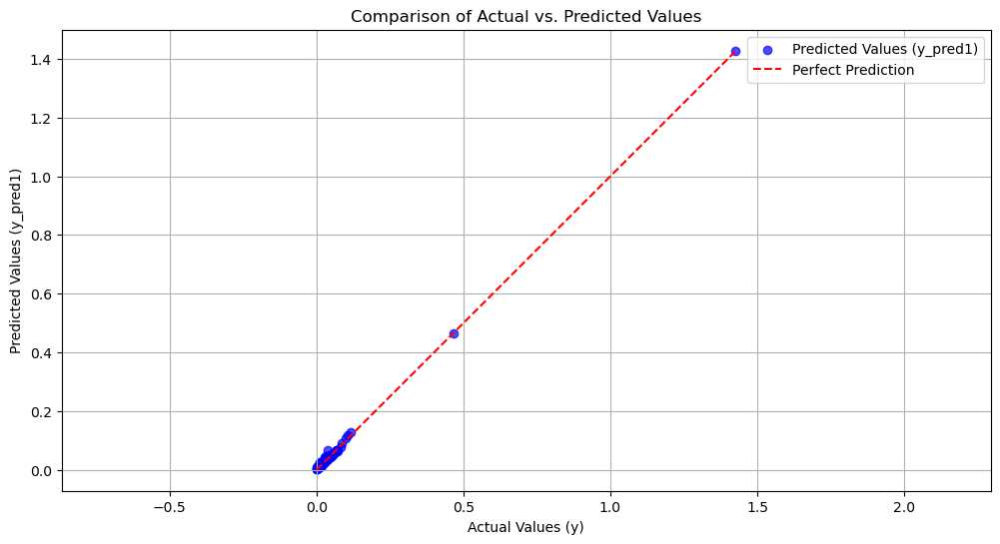

In [47]:
# Calculate metrics
rmse = np.sqrt(mean_squared_error(y, y_pred1))
mae = mean_absolute_error(y, y_pred1)
r2 = r2_score(y, y_pred1)

# Print metrics
print(f"Root Mean Squared Error (RMSE): {rmse:.4f}")
print(f"Mean Absolute Error (MAE): {mae:.4f}")
print(f"R-squared (R²): {r2:.4f}")

# Create a scatter plot to compare y and y_pred1
plt.figure(figsize=(12, 6))
plt.scatter(y, y_pred1, color='blue', label='Predicted Values (y_pred1)', alpha=0.7)
plt.plot([min(y), max(y)], [min(y), max(y)], color='red', label='Perfect Prediction', linestyle='--')

# Add titles and labels
plt.title('Comparison of Actual vs. Predicted Values')
plt.xlabel('Actual Values (y)')
plt.ylabel('Predicted Values (y_pred1)')
plt.legend()
plt.grid()
plt.axis('equal')  # Ensure the aspect ratio is equal
plt.show()

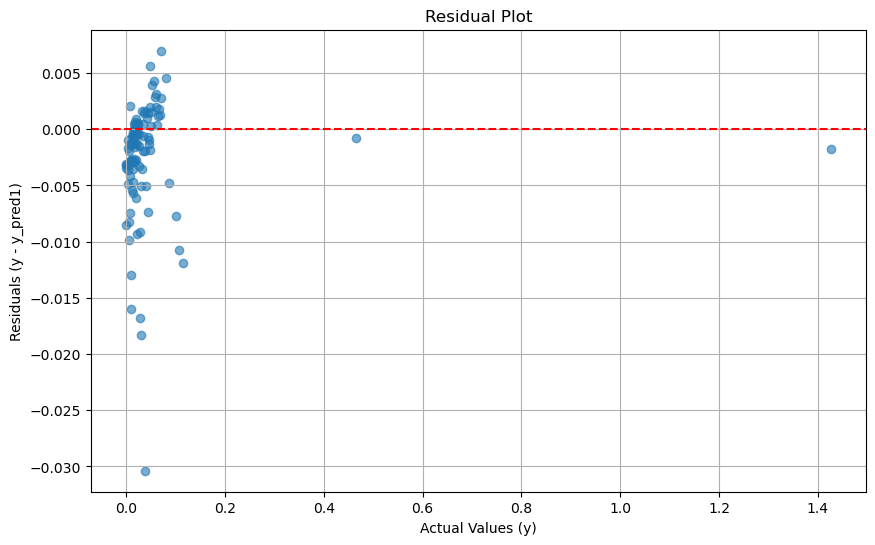

In [49]:
residuals = y - y_pred1
plt.figure(figsize=(10, 6))
plt.scatter(y, residuals, alpha=0.6)
plt.axhline(0, color='red', linestyle='--')
plt.title('Residual Plot')
plt.xlabel('Actual Values (y)')
plt.ylabel('Residuals (y - y_pred1)')
plt.grid()
plt.show()


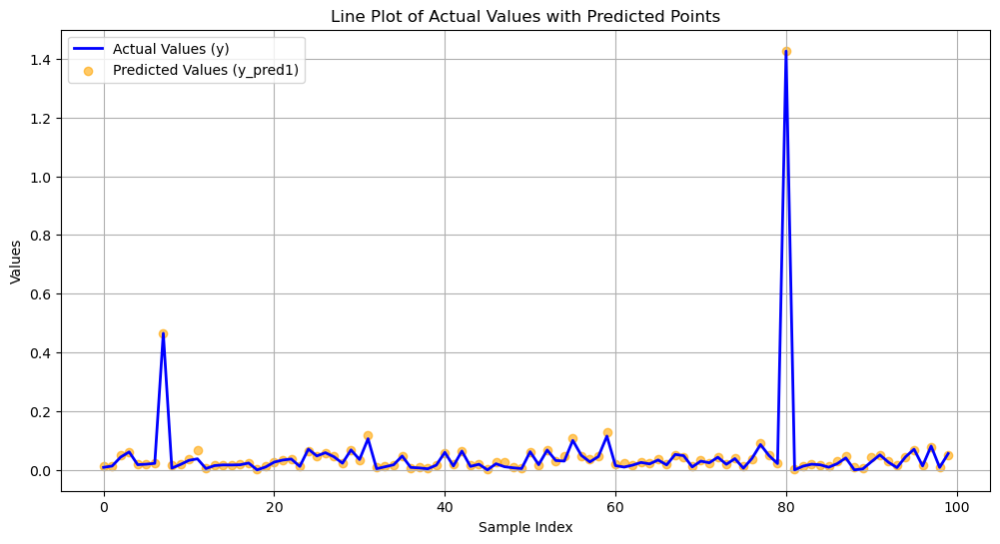

In [50]:
# Line plot with data points on each index of the sample data

plt.figure(figsize=(12, 6))
plt.plot(y, label='Actual Values (y)', color='blue', linewidth=2)
plt.scatter(range(len(y)), y_pred1, label='Predicted Values (y_pred1)', color='orange', alpha=0.6)
plt.title('Line Plot of Actual Values with Predicted Points')
plt.xlabel('Sample Index')
plt.ylabel('Values')
plt.legend()
plt.grid()
plt.show()


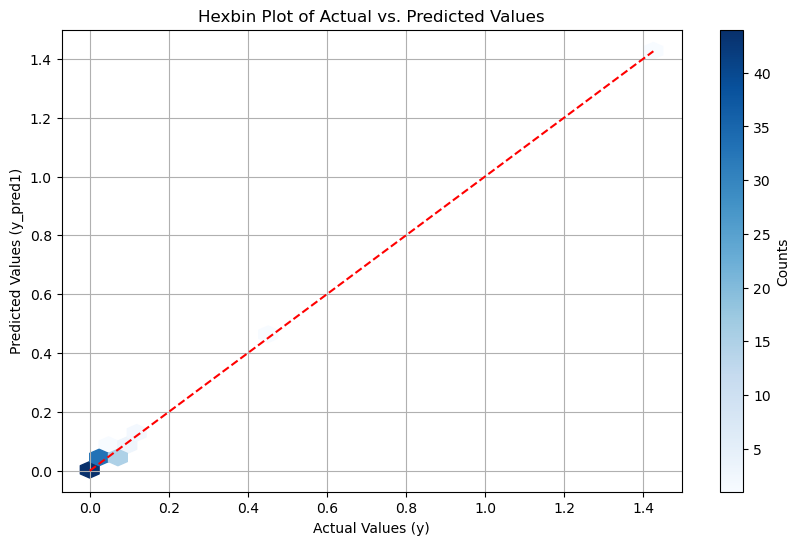

In [51]:
# Hexbin plot

plt.figure(figsize=(10, 6))
plt.hexbin(y, y_pred1, gridsize=30, cmap='Blues', mincnt=1)
plt.colorbar(label='Counts')
plt.plot([y.min(), y.max()], [y.min(), y.max()], 'r--')  # Diagonal line for reference
plt.title('Hexbin Plot of Actual vs. Predicted Values')
plt.xlabel('Actual Values (y)')
plt.ylabel('Predicted Values (y_pred1)')
plt.grid()
plt.show()


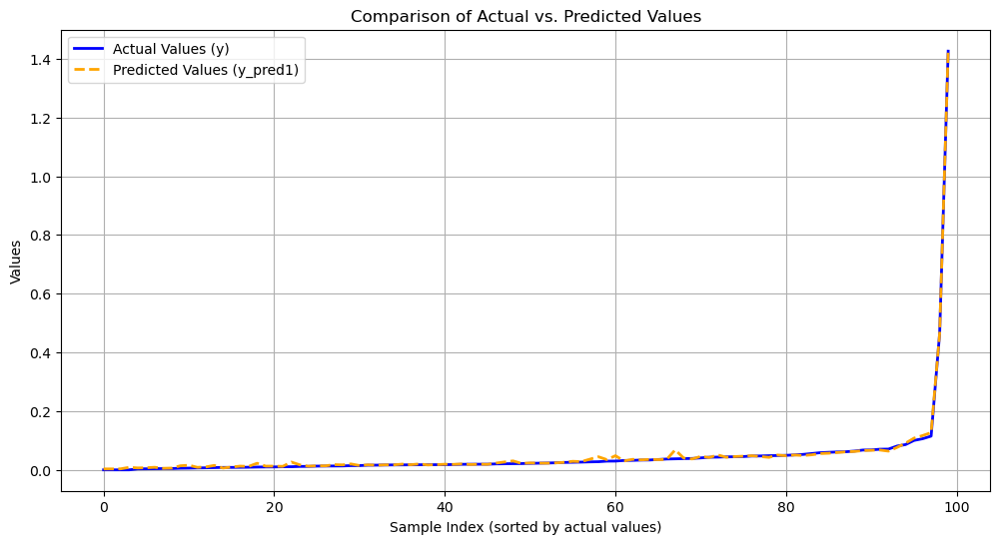

In [48]:
# Sort the actual values and predicted values for line plotting
sorted_indices = np.argsort(y)
y_sorted = y[sorted_indices]
y_pred1_sorted = y_pred1[sorted_indices]

# Create a line graph to compare y and y_pred1
plt.figure(figsize=(12, 6))
plt.plot(y_sorted, label='Actual Values (y)', color='blue', linewidth=2)
plt.plot(y_pred1_sorted, label='Predicted Values (y_pred1)', color='orange', linestyle='--', linewidth=2)

# Add titles and labels
plt.title('Comparison of Actual vs. Predicted Values')
plt.xlabel('Sample Index (sorted by actual values)')
plt.ylabel('Values')
plt.legend()
plt.grid()
plt.show()

trying the simplest equation discovered


In [52]:
# Calculating y_pred2
y_pred2 = 2.8746848 / (x3 + x1)

In [53]:


# Calculate RMSE
rmse2 = np.sqrt(mean_squared_error(y, y_pred2))
print(f'Root Mean Squared Error (RMSE) for y_pred2: {rmse2:.4f}')


Root Mean Squared Error (RMSE) for y_pred2: 0.0295


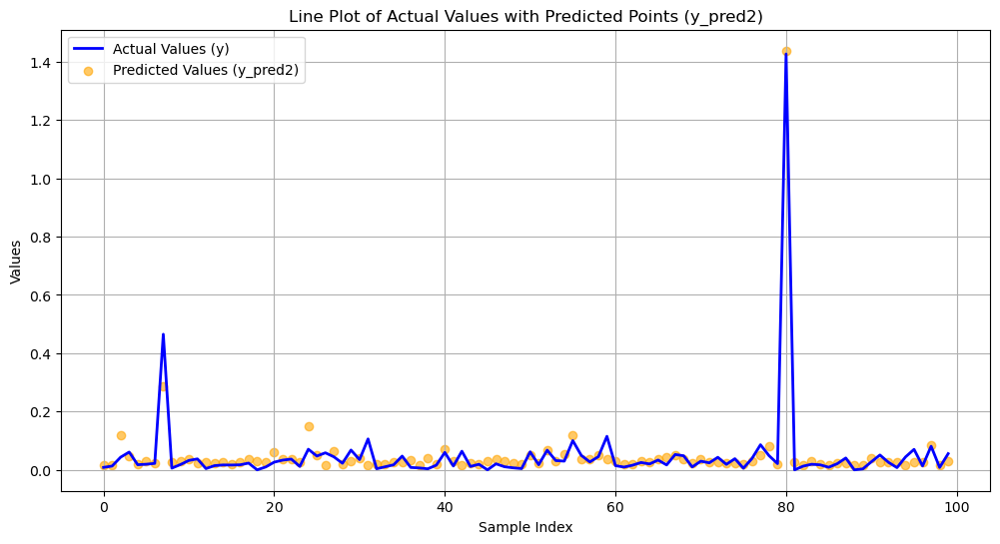

In [54]:
plt.figure(figsize=(12, 6))
plt.plot(y, label='Actual Values (y)', color='blue', linewidth=2)
plt.scatter(range(len(y)), y_pred2, label='Predicted Values (y_pred2)', color='orange', alpha=0.6)
plt.title('Line Plot of Actual Values with Predicted Points (y_pred2)')
plt.xlabel('Sample Index')
plt.ylabel('Values')
plt.legend()
plt.grid()
plt.show()


In [55]:
# the most interpretable equation with the closeste loss,
# only one constant 

y_pred3 = np.sqrt(276.1953 / x4) / ((x3 - np.tan(np.log(x1))) + x1)

In [56]:
# Calculate RMSE
rmse3 = np.sqrt(mean_squared_error(y, y_pred3))
print(f'Root Mean Squared Error (RMSE) for y_pred3: {rmse3:.4f}')

Root Mean Squared Error (RMSE) for y_pred3: 0.0121


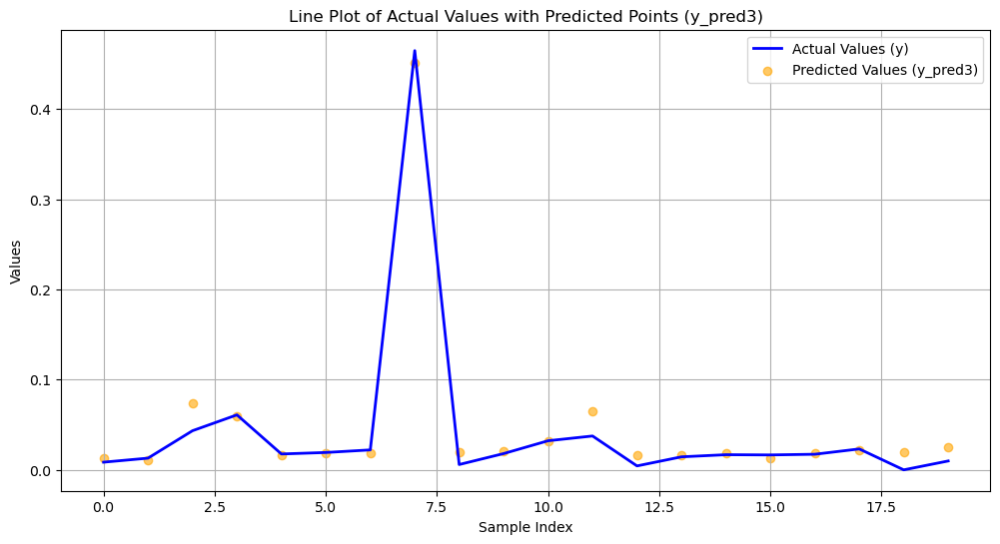

In [58]:
plt.figure(figsize=(12, 6))
plt.plot(y[0:20], label='Actual Values (y)', color='blue', linewidth=2)
plt.scatter(range(len(y[0:20])), y_pred3[0:20], label='Predicted Values (y_pred3)', color='orange', alpha=0.6)
plt.title('Line Plot of Actual Values with Predicted Points (y_pred3)')
plt.xlabel('Sample Index')
plt.ylabel('Values')
plt.legend()
plt.grid()
plt.show()

tweeking the parameters, to see whether the model can find the actual equation

In [59]:
# Train the symbolic regression model

model2 = PySRRegressor(
    niterations=1000,  # Number of iterations (adjust as necessary)
    
    # List of binary operators (two inputs)
    binary_operators=[
        "+",    # Addition
       
        "*",    # Multiplication
        "/",    # Division
        "^",    # Power (alternative to **)
        
    ],
    
    # List of unary operators (one input)
    unary_operators=[
        
        "log",      # Natural logarithm (ln(x))
       
        "sqrt",     # Square root
        
    ],
    
    # Define any custom operators (optional)
   
    variable_names=[f"x{i}" for i in range(X.shape[1])],
    model_selection=accuracy,                    # Enable model selection mode
    population_size=1000,               # Population size for evolutionary search
    maxsize=20                          # Maximum complexity of equations
)


c:\Users\chidi\anaconda3\envs\boot_DA\lib\site-packages\pysr\sr.py:922: FutureWarning: `variable_names` is a data-dependent parameter and should be passed when fit is called. Ignoring parameter; please pass `variable_names` during the call to fit instead.
  warnings.warn(


In [ ]:
model2.fit(X,y)

c:\Users\chidi\anaconda3\envs\boot_DA\lib\site-packages\pysr\sr.py:1989: UserWarning: The discovered expressions are being reset. Please set `warm_start=True` if you wish to continue to start a search where you left off.
  warnings.warn(
c:\Users\chidi\anaconda3\envs\boot_DA\lib\site-packages\pysr\sr.py:2582: UserWarning: Note: it looks like you are running in Jupyter. The progress bar will be turned off.
  warnings.warn(
c:\Users\chidi\anaconda3\envs\boot_DA\lib\site-packages\pysr\sr.py:73: UserWarning: You are using the `^` operator, but have not set up `constraints` for it. This may lead to overly complex expressions. One typical constraint is to use `constraints={..., '^': (-1, 1)}`, which will allow arbitrary-complexity base (-1) but only powers such as a constant or variable (1). For more tips, please see https://astroautomata.com/PySR/tuning/
  warnings.warn(


In [5]:
# sqrt(sqrt(((x2 + -0.99988294) * ((x0 + log(x2)) / 1.1536975)) * x5) / x4) / (x3 + x1)

y_pred4 = np.sqrt(np.sqrt(((x2 + -0.99988294) * ((x0 + np.log(x2)) / 1.1536975)) * x5) / x4) / (x3 + x1)

In [6]:
# Calculate RMSE
rmse4 = np.sqrt(mean_squared_error(y, y_pred4))
print(f'Root Mean Squared Error (RMSE) for y_pred4: {rmse4:.4f}')

NameError: name 'mean_squared_error' is not defined

In [8]:
# R-squared (R^2)
r2 = r2_score(y, y_pred4)
print(f"R-squared: {r2}")

R-squared: 0.9998396118980789


# Exploring the Relationship Between the ground truth equation and Symbolic Regression Equations

To explore the relationship between the two equations, let's break down each component and look for structural similarities or functional relationships.

### Equation 1 (the ground truth governing law):
$$
\text{Eq1} = \frac{(x_0 \cdot x_5)^{0.2}}{x_1 + x_3} \cdot \frac{\log(x_2)}{\sqrt{x_4}}
$$

#### Components of Equation 1:
1. 
$$
   (x_0 \cdot x_5)^{0.2}
$$
This term takes the product of $$x_0 and x_5$$ and raises it to the power of 0.2, which is the fifth root of the product.

2. 
$$
   (x_1 + x_3)
$$
: Denominator in the first fraction, affecting the scale of Eq1 based on the sum of $$x_1 and x_3$$.

3. 
$$
   {\log(x_2)}
$$
: Logarithmic term on $$x_2$$ in the numerator of the second fraction.

4. 
$$
   {\sqrt{x_4}}
$$
: Square root of $$x_4$$, acting as a divisor in the second fraction.

### Equation 2:
$$
\text{Eq2} = \frac{\sqrt{\sqrt{((x_2 + -0.99988294) \cdot \left(\frac{x_0 + \log(x_2)}{1.1536975}\right) \cdot x_5) / x_4}}}{x_3 + x_1}
$$

#### Components of Equation 2:
1. **\(x_2 + -0.99988294\)**: This term adds a small constant to \(x_2\), slightly shifting its value.
2. **\(\frac{x_0 + \log(x_2)}{1.1536975}\)**: Involves \(x_0\) plus the logarithm of \(x_2\), scaled by dividing by 1.1536975.
3. **\(x_5\)**: Multiplied within the inner expression, similar to Eq1.
4. **\(x_4\)**: Acts as a divisor within the square root function.
5. **\(\sqrt{\sqrt{\cdots}}\)**: Uses two square roots, resulting in the fourth root of the entire inner expression.
6. **\(x_3 + x_1\)**: This sum is in the denominator, which also appears in Eq1.

### Comparing Structural and Functional Elements

1. **Use of Terms**:
   - Both equations involve **products and roots** involving \(x_0\) and \(x_5\) and depend on logarithmic and square root transformations of \(x_2\) and \(x_4\).
   - \(x_3 + x_1\) is in the denominator in both equations, affecting the overall magnitude similarly.

2. **Complexity and Scaling**:
   - **Eq1** uses simpler transformations (fifth root and single square root), while **Eq2** involves nested square roots, resulting in a fourth root, which may make **Eq2** generally "flatter" in response to changes in input values.
   - **Eq2** has an additional constant adjustment \(-0.99988294\) on \(x_2\), potentially shifting the input distribution slightly from Eq1's.

3. **Logarithmic Components**:
   - Both equations apply \(\log(x_2)\), although in **Eq2** it is combined with \(x_0\) and scaled, while in **Eq1** it stands alone in a fraction.

4. **Interpretation of Relationships**:
   - **Eq2** appears to be a more complex or transformed version of **Eq1**, with additional scaling and root layers.
   - Both may produce similar output ranges, but **Eq2** may show smoother or less responsive changes due to the fourth root's dampening effect on values.

### Summary of Relationship
Eq2 is a more transformed and complex form of Eq1, using similar variables but with additional scaling, nested roots, and slight shifts in values. Both equations are structurally related, using similar variables and transformations, but Eq2’s additional depth could yield smoother, less sensitive responses to input changes than Eq1.


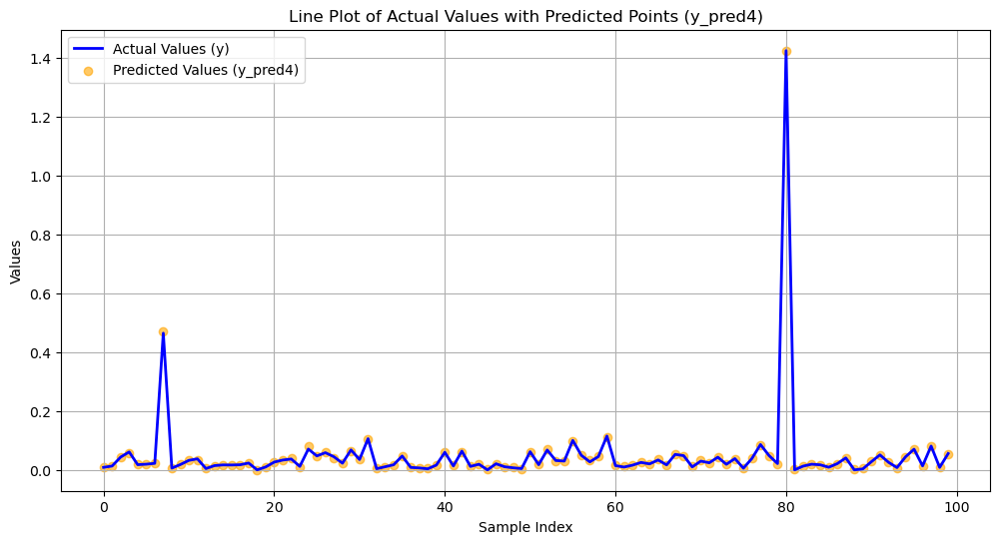

In [6]:
plt.figure(figsize=(12, 6))
plt.plot(y, label='Actual Values (y)', color='blue', linewidth=2)
plt.scatter(range(len(y)), y_pred4, label='Predicted Values (y_pred4)', color='orange', alpha=0.6)
plt.title('Line Plot of Actual Values with Predicted Points (y_pred4)')
plt.xlabel('Sample Index')
plt.ylabel('Values')
plt.legend()
plt.grid()
plt.show()

In [7]:
data_describe = df.describe()

In [8]:
data_describe

,x0,x1,x2,x3,x4,x5,y
count,100.0000,100.00000,100.000000,100.000000,100.000000,100.000000,100.000000
mean,46.9800,51.80000,45.190000,52.910000,52.180000,50.100000,0.048107
std,28.1909,29.29612,29.809054,29.931941,29.655728,29.518527,0.147815
min,1.0000,1.00000,1.000000,1.000000,1.000000,2.000000,0.000000
25%,23.0000,24.75000,19.000000,28.750000,27.000000,26.250000,0.012466
50%,51.5000,54.00000,44.000000,51.500000,52.500000,48.000000,0.021736
75%,68.0000,76.25000,64.750000,84.250000,80.000000,75.000000,0.044726
max,99.0000,99.00000,99.000000,99.000000,99.000000,99.000000,1.425918


# Data Reconstruction Trial

**This is an attempt to use Equation Discovery for data reconstruction**


In [ ]:
# y_pred4 = np.sqrt(np.sqrt(((x2 + -0.99988294) * ((x0 + np.log(x2)) / 1.1536975)) * x5) / x4) / (x3 + x1)

**First**: we convert the discovered sympolic expression to a callable function

In [112]:
from sympy import symbols, sqrt, log, lambdify

# Define symbols
x0, x1, x2, x3, x4, x5 = symbols('x0 x1 x2 x3 x4 x5')

# Define formula
formula_expr = sqrt(sqrt(((x2 + -0.99988294) * ((x0 + log(x2)) / 1.1536975) * x5) / x4)) / (x3 + x1)

# Convert formula to a callable function
formula = lambdify((x0, x1, x2, x3, x4, x5), formula_expr, 'numpy')


**Second**: We get the statistical description of the dataset

In [10]:
data_description = data_describe.drop(columns="y")

In [11]:
data_description = data_description.T


In [12]:
data_description

,count,mean,std,min,25%,50%,75%,max
x0,100.0,46.98,28.190900,1.0,23.00,51.5,68.00,99.0
x1,100.0,51.80,29.296120,1.0,24.75,54.0,76.25,99.0
x2,100.0,45.19,29.809054,1.0,19.00,44.0,64.75,99.0
x3,100.0,52.91,29.931941,1.0,28.75,51.5,84.25,99.0
x4,100.0,52.18,29.655728,1.0,27.00,52.5,80.00,99.0
x5,100.0,50.10,29.518527,2.0,26.25,48.0,75.00,99.0


In [12]:
y

array([0.00851437, 0.01298173, 0.04337289, 0.06097262, 0.017606  ,
       0.01925545, 0.02212185, 0.46492743, 0.00589976, 0.01805099,
       0.03226567, 0.03755202, 0.00436203, 0.01443671, 0.01680472,
       0.01654622, 0.017307  , 0.02320014, 0.        , 0.00985   ,
       0.02636875, 0.03336348, 0.03692049, 0.01178337, 0.07073057,
       0.04732748, 0.05846504, 0.04455093, 0.02269123, 0.06792885,
       0.0351156 , 0.10596586, 0.00388698, 0.010519  , 0.01733318,
       0.04715107, 0.0082321 , 0.0065228 , 0.00356956, 0.01606117,
       0.05977061, 0.01316826, 0.06387092, 0.01162829, 0.01908895,
       0.        , 0.02069116, 0.01062603, 0.00698318, 0.00432925,
       0.06167371, 0.01758567, 0.06745401, 0.03185616, 0.0298636 ,
       0.10026106, 0.04941489, 0.02713558, 0.04525264, 0.11489713,
       0.01440664, 0.0094962 , 0.01588959, 0.0251893 , 0.02024554,
       0.033584  , 0.01685664, 0.05264034, 0.04821757, 0.00991327,
       0.02970068, 0.02406543, 0.04300299, 0.01887894, 0.03825

In [13]:
target = y_pred4

In [35]:
import pandas as pd
import numpy as np
from scipy.optimize import minimize
from sympy import lambdify
from typing import Callable

def data_reconstruct(data_description: pd.DataFrame, formula: Callable, target: np.ndarray) -> pd.DataFrame:
    """
    Reconstruct data variables that fit a specified formula close to each target value in `target`.

    Parameters:
    data_description (pd.DataFrame): Descriptive statistics for each variable in the data.
                                     Should contain mean, std, min, max, IQR, and count for each variable.
    formula (Callable): A function or sympy expression that takes in independent variables and outputs y_pred.
    target (np.ndarray): Array of target values for y_pred, which determine the number of rows to reconstruct.

    Returns:
    pd.DataFrame: Estimated values for each independent variable for each target value.
    """
    
    # Extract variable names from the data description
    variable_names = data_description.index.to_list()
    
    # Initialize an empty DataFrame to store all reconstructed data rows
    reconstructed_data = pd.DataFrame(columns=variable_names)
    
    # Iterate over each target value to generate a corresponding row of estimated variables
    for t in target:
        # Define the objective function for each target value to minimize the difference between formula output and target
        def objective_function(variables):
            y_pred = formula(*variables)  # Apply the formula with the given variables
            error = (y_pred - t) ** 2  # Squared error for this specific target
            return error

        # Initial guess based on the mean of each variable
        initial_guess = data_description['mean'].values
        
        # Set bounds for each variable based on min and max in data description
        bounds = [(data_description.loc[var, 'min'], data_description.loc[var, 'max']) for var in variable_names]
        
        # Run the optimization for the current target value
        result = minimize(objective_function, initial_guess, bounds=bounds, method='L-BFGS-B')
        
        # Check if optimization was successful
        if not result.success:
            raise ValueError(f"Optimization did not converge for target value {t}. Please check the data and formula.")
        
        # Append the optimized variables as a new row in the DataFrame
        reconstructed_data = pd.concat(
            [reconstructed_data, pd.DataFrame([result.x], columns=variable_names)],
            ignore_index=True
        )
    
    # Adjust each variable's row count to match the count from the data description
    final_reconstructed_data = pd.DataFrame()
    for var in variable_names:
        count = int(data_description.loc[var, 'count'])  # Number of values to generate for each variable
        repeated_values = np.tile(reconstructed_data[var].values, (count // len(target)))
        final_reconstructed_data[var] = repeated_values[:count]  # Trim to exact count if necessary

    return final_reconstructed_data


In [37]:
final_reconstructed_data = data_reconstruct(data_description, formula, target)



C:\Users\chidi\AppData\Local\Temp\ipykernel_61184\4166912756.py:49: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  reconstructed_data = pd.concat(


In [38]:
final_reconstructed_data

,x0,x1,x2,x3,x4,x5
0,31.637089,76.016070,3.197526,77.126070,72.112138,9.738307
1,46.678187,83.745268,20.557503,84.855268,64.945946,29.670330
2,46.979988,51.800023,45.189986,52.910023,52.180011,50.099988
3,46.980000,51.800000,45.190000,52.910000,52.180000,50.100000
4,36.269216,68.652243,22.399062,69.762248,64.303583,31.596131
...,...,...,...,...,...,...
95,46.980000,51.800000,45.190000,52.910000,52.180000,50.100000
96,48.340508,82.978833,27.316547,84.088833,70.370391,35.991485
97,46.980012,51.799977,45.190014,52.909977,52.179988,50.100012
98,34.942382,77.906443,1.265942,79.016443,70.657632,21.534921


In [39]:
final_reconstructed_data.describe()

,x0,x1,x2,x3,x4,x5
count,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000
mean,41.672657,68.886215,26.895282,69.976121,61.701077,36.121339
std,9.926086,16.711585,17.439958,16.699565,10.533527,14.920623
min,2.330554,3.169946,1.000000,4.268695,28.365306,2.029976
25%,35.318083,51.800021,14.690793,52.910021,52.180010,27.969066
50%,45.553012,74.018239,28.552060,75.128242,61.971219,37.647270
75%,46.980000,80.055521,45.189987,81.165521,69.069131,50.099989
max,71.406628,97.239575,73.803148,98.349575,92.364373,74.863585


The `formula` callable function represents the mathematical equation that produces the target variable (`y_pred`) based on given independent variables (`x0`, `x1`, `x2`, `x3`, `x4`, `x5`). Here’s what the callable function does in detail:

1. **Takes in Independent Variable Values**: The function requires specific values for each independent variable (e.g., `x0`, `x1`, `x2`, etc.) as input. These values are usually provided as arguments in the function call.

2. **Applies the Equation**: Within the function, it applies the specified mathematical formula to calculate an output. The function structure is based on the equation you defined in symbolic form. In this case, the equation is:

   $$
   y_{\text{pred}} = \frac{\sqrt{\sqrt{\left((x_2 + -0.99988294) \times \frac{(x_0 + \log(x_2))}{1.1536975} \times x_5\right) / x_4}}}{x_3 + x_1}
   $$

   This formula combines several mathematical operations:
   - **Addition, Multiplication, and Division**: Standard arithmetic operations.
   - **Logarithm (`log`)**: Applies a natural logarithm on `x2`.
   - **Square Roots (`sqrt`)**: Applies nested square root operations on parts of the expression.

3. **Returns an Output (Target)**: After calculating the result from the equation, the function returns this value as `y_pred`. This output is the predicted target value based on the current input values of the independent variables.

4. **Used for Optimization**: In the `data_reconstruct` function, this `formula` callable is used within an optimization process. Each time the optimizer guesses values for the independent variables, it calculates `y_pred` using the formula. The optimization minimizes the difference between `y_pred` (as computed by `formula`) and the actual target values provided.

### How the Callable Formula is Created

Using the symbolic expression and `lambdify` from SymPy:
- The formula was initially written symbolically with SymPy (using `symbols`, `sqrt`, `log`, etc.).
- `lambdify` transforms this symbolic formula into a fast, callable function that behaves like a standard Python function and can be used directly with NumPy arrays.

In summary, the `formula` callable serves as a mathematical model that, for given values of independent variables, predicts an output. It is central to optimization, where it helps evaluate how close different input combinations get to the target values by applying the specified mathematical relationship.

No, the `formula` function does **not** inherently rearrange the equation to solve for each independent variable (e.g., `x0`, `x1`, etc.) based on the target value (`y_pred`). It works in a straightforward way: it takes values for the independent variables as inputs and calculates the result according to the formula. 

In other words:
- The formula is a **one-directional function** that calculates `y_pred` given values for `x0`, `x1`, `x2`, etc.
- It **does not dynamically rearrange** itself to make any specific variable the subject of the formula.

### How Variables Are Approximated in the Optimization Process

If your goal is to find values for each independent variable based on a target value of `y_pred`, the optimization process we implemented in `data_reconstruct` plays a key role. Here’s how:

1. **Objective Function**: In `data_reconstruct`, we defined an `objective_function` that calculates the squared error between `y_pred` (computed by the formula with current values of `x0`, `x1`, etc.) and the specific target value.
  
2. **Optimization Routine**: The optimization routine (`minimize`) tries to find values of `x0`, `x1`, ..., `x5` that make `y_pred` as close as possible to the target by adjusting the values of the independent variables without explicitly rearranging the formula for each variable. Instead, it finds variable values by iteratively adjusting them to minimize the difference between computed `y_pred` and the actual target.

### Example of How Optimization Mimics Making Variables the Subject

Let’s say you want to estimate values for `x0`, `x1`, etc., for a specific target value, say `y_pred = 10`. The optimization will:
- Start with initial guesses for `x0`, `x1`, etc.
- Use these guesses in the formula to calculate an output (`y_pred`).
- Compare the calculated `y_pred` with 10 (the target).
- Adjust the values of `x0`, `x1`, ..., `x5` and recompute `y_pred` iteratively to minimize the difference until the formula's output is close to the target.

In essence, the optimization routine provides an **approximation** of values for the independent variables that satisfy the formula for a given target, without explicitly rearranging the formula to make each variable the subject.

In [40]:
import pandas as pd
import numpy as np
from scipy.optimize import minimize
from sympy import lambdify
from typing import Callable

def data_reconstruct2(data_description: pd.DataFrame, formula: Callable, target: np.ndarray) -> pd.DataFrame:
    """
    Reconstruct data variables that fit a specified formula close to each target value in `target`.

    Parameters:
    data_description (pd.DataFrame): Descriptive statistics for each variable in the data.
                                     Should contain mean, std, min, max, IQR, and count for each variable.
    formula (Callable): A function or sympy expression that takes in independent variables and outputs y_pred.
    target (np.ndarray): Array of target values for y_pred, which determine the number of rows to reconstruct.

    Returns:
    pd.DataFrame: Estimated values for each independent variable for each target value,
                  with an additional column for the target values.
    """
    
    # Extract variable names from the data description
    variable_names = data_description.index.to_list()
    
    # Initialize an empty DataFrame to store all reconstructed data rows
    reconstructed_data = pd.DataFrame(columns=variable_names)
    
    # Iterate over each target value to generate a corresponding row of estimated variables
    for t in target:
        # Define the objective function for each target value to minimize the difference between formula output and target
        def objective_function(variables):
            y_pred = formula(*variables)  # Apply the formula with the given variables
            error = (y_pred - t) ** 2  # Squared error for this specific target
            return error

        # Initial guess based on the mean of each variable
        initial_guess = data_description['mean'].values
        
        # Set bounds for each variable based on min and max in data description
        bounds = [(data_description.loc[var, 'min'], data_description.loc[var, 'max']) for var in variable_names]
        
        # Run the optimization for the current target value
        result = minimize(objective_function, initial_guess, bounds=bounds, method='L-BFGS-B')
        
        # Check if optimization was successful
        if not result.success:
            raise ValueError(f"Optimization did not converge for target value {t}. Please check the data and formula.")
        
        # Append the optimized variables as a new row in the DataFrame
        reconstructed_data = pd.concat(
            [reconstructed_data, pd.DataFrame([result.x], columns=variable_names)],
            ignore_index=True
        )
    
    # Add the target values as a new column to the reconstructed data
    reconstructed_data['target'] = target
    
    # Ensure the index of `reconstructed_data` aligns with the order of `target` (i.e., same order as input target array)
    reconstructed_data.index = pd.RangeIndex(start=0, stop=len(target), step=1)
    
    return reconstructed_data


In [41]:
final_data = data_reconstruct2(data_description, formula, target)

C:\Users\chidi\AppData\Local\Temp\ipykernel_61184\1984032617.py:50: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  reconstructed_data = pd.concat(


In [42]:
final_data

,x0,x1,x2,x3,x4,x5,target
0,31.637089,76.016070,3.197526,77.126070,72.112138,9.738307,0.008432
1,46.678187,83.745268,20.557503,84.855268,64.945946,29.670330,0.012600
2,46.979988,51.800023,45.189986,52.910023,52.180011,50.099988,0.043764
3,46.980000,51.800000,45.190000,52.910000,52.180000,50.100000,0.058433
4,36.269216,68.652243,22.399062,69.762248,64.303583,31.596131,0.018489
...,...,...,...,...,...,...,...
95,46.980000,51.800000,45.190000,52.910000,52.180000,50.100000,0.069993
96,48.340508,82.978833,27.316547,84.088833,70.370391,35.991485,0.012700
97,46.980012,51.799977,45.190014,52.909977,52.179988,50.100012,0.082120
98,34.942382,77.906443,1.265942,79.016443,70.657632,21.534921,0.007888


In [43]:
import pandas as pd
import numpy as np
from scipy.optimize import minimize
from sympy import lambdify
from typing import Callable

def data_reconstruct3(data_description: pd.DataFrame, formula: Callable, target: np.ndarray) -> pd.DataFrame:
    """
    Reconstruct data variables that fit a specified formula close to each target value in `target`.

    Parameters:
    data_description (pd.DataFrame): Descriptive statistics for each variable in the data.
                                     Should contain mean, std, min, max, IQR, and count for each variable.
    formula (Callable): A function or sympy expression that takes in independent variables and outputs y_pred.
    target (np.ndarray): Array of target values for y_pred, which determine the number of rows to reconstruct.

    Returns:
    pd.DataFrame: Estimated values for each independent variable for each target value,
                  with columns for the target, approximated target, and loss.
    """
    
    # Extract variable names from the data description
    variable_names = data_description.index.to_list()
    
    # Initialize an empty DataFrame to store all reconstructed data rows
    reconstructed_data = pd.DataFrame(columns=variable_names + ['target', 'approx_target', 'loss'])
    
    # Iterate over each target value to generate a corresponding row of estimated variables
    for t in target:
        # Define the objective function for each target value to minimize the difference between formula output and target
        def objective_function(variables):
            y_pred = formula(*variables)  # Apply the formula with the given variables
            error = (y_pred - t) ** 2  # Squared error for this specific target
            return error

        # Initial guess based on the mean of each variable
        initial_guess = data_description['mean'].values
        
        # Set bounds for each variable based on min and max in data description
        bounds = [(data_description.loc[var, 'min'], data_description.loc[var, 'max']) for var in variable_names]
        
        # Run the optimization for the current target value
        result = minimize(objective_function, initial_guess, bounds=bounds, method='L-BFGS-B')
        
        # Check if optimization was successful
        if not result.success:
            raise ValueError(f"Optimization did not converge for target value {t}. Please check the data and formula.")
        
        # Calculate the approximated target and loss
        approximated_target = formula(*result.x)
        loss = np.abs(approximated_target - t)
        
        # Append the optimized variables as a new row in the DataFrame with target, approximated target, and loss
        row_data = list(result.x) + [t, approximated_target, loss]
        reconstructed_data = pd.concat(
            [reconstructed_data, pd.DataFrame([row_data], columns=variable_names + ['target', 'approx_target', 'loss'])],
            ignore_index=True
        )
    
    # Ensure the index of `reconstructed_data` aligns with the order of `target`
    reconstructed_data.index = pd.RangeIndex(start=0, stop=len(target), step=1)
    
    return reconstructed_data


In [46]:
final_data_2 = data_reconstruct3(data_description, formula, target)

C:\Users\chidi\AppData\Local\Temp\ipykernel_61184\2940772562.py:55: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  reconstructed_data = pd.concat(


In [47]:
final_data_2

,x0,x1,x2,x3,x4,x5,target,approx_target,loss
0,31.637089,76.016070,3.197526,77.126070,72.112138,9.738307,0.008432,0.011129,0.002697
1,46.678187,83.745268,20.557503,84.855268,64.945946,29.670330,0.012600,0.026271,0.013672
2,46.979988,51.800023,45.189986,52.910023,52.180011,50.099988,0.043764,0.062784,0.019020
3,46.980000,51.800000,45.190000,52.910000,52.180000,50.100000,0.058433,0.062784,0.004351
4,36.269216,68.652243,22.399062,69.762248,64.303583,31.596131,0.018489,0.031445,0.012957
...,...,...,...,...,...,...,...,...,...
95,46.980000,51.800000,45.190000,52.910000,52.180000,50.100000,0.069993,0.062784,0.007209
96,48.340508,82.978833,27.316547,84.088833,70.370391,35.991485,0.012700,0.029656,0.016956
97,46.980012,51.799977,45.190014,52.909977,52.179988,50.100012,0.082120,0.062784,0.019336
98,34.942382,77.906443,1.265942,79.016443,70.657632,21.534921,0.007888,0.007991,0.000103


In [54]:
import pandas as pd
import numpy as np
from scipy.optimize import minimize
from sympy import lambdify
from typing import Callable

def data_reconstruct_main(data_description: pd.DataFrame, formula: Callable, target: np.ndarray,
                     max_attempts: int = 10, tolerance: float = 1e-5) -> pd.DataFrame:
    """
    Reconstruct data variables that fit a specified formula close to each target value in `target`.

    Parameters:
    data_description (pd.DataFrame): Descriptive statistics for each variable in the data.
                                     Should contain mean, std, min, max, IQR, and count for each variable.
    formula (Callable): A function or sympy expression that takes in independent variables and outputs y_pred.
    target (np.ndarray): Array of target values for y_pred, which determine the number of rows to reconstruct.
    max_attempts (int): Maximum number of optimization attempts to reach close approximation for each target.
    tolerance (float): Desired accuracy for approximated target. If |approx_target - target| < tolerance, stop iteration.

    Returns:
    pd.DataFrame: Estimated values for each independent variable for each target value,
                  with columns for the target, approximated target, and loss.
    """
    
    # Extract variable names from the data description
    variable_names = data_description.index.to_list()
    
    # Initialize an empty DataFrame to store all reconstructed data rows
    reconstructed_data = pd.DataFrame(columns=variable_names + ['target', 'approx_target', 'loss'])
    
    # Iterate over each target value to generate a corresponding row of estimated variables
    for t in target:
        attempt = 0
        best_loss = float('inf')
        best_approx_target = None
        best_vars = None

        while attempt < max_attempts:
            # Define the objective function for each target value to minimize the difference between formula output and target
            def objective_function(variables):
                y_pred = formula(*variables)  # Apply the formula with the given variables
                error = (y_pred - t) ** 2  # Squared error for this specific target
                return error

            # Initial guess based on the mean of each variable, adding small random noise to vary attempts
            initial_guess = data_description['mean'].values + np.random.normal(0, 0.1, len(variable_names))
            
            # Set bounds for each variable based on min and max in data description
            bounds = [(data_description.loc[var, 'min'], data_description.loc[var, 'max']) for var in variable_names]
            
            # Run the optimization for the current target value
            result = minimize(objective_function, initial_guess, bounds=bounds, method='L-BFGS-B')
            
            # Calculate the approximated target and loss
            approximated_target = formula(*result.x)
            loss = np.abs(approximated_target - t)
            
            # Check if this is the best approximation so far
            if loss < best_loss:
                best_loss = loss
                best_approx_target = approximated_target
                best_vars = result.x
            
            # Stop early if within tolerance
            if best_loss <= tolerance:
                break
            
            # Increment the attempt counter
            attempt += 1
        
        # If no attempts met the tolerance, we save the best approximation from all attempts
        row_data = list(best_vars) + [t, best_approx_target, best_loss]
        reconstructed_data = pd.concat(
            [reconstructed_data, pd.DataFrame([row_data], columns=variable_names + ['target', 'approx_target', 'loss'])],
            ignore_index=True
        )
    
    # Ensure the index of `reconstructed_data` aligns with the order of `target`
    reconstructed_data.index = pd.RangeIndex(start=0, stop=len(target), step=1)
    
    return reconstructed_data


In [55]:
# Define your data_description DataFrame, formula, and target as before...

final_data_3 = data_reconstruct_main(data_description, formula, target, max_attempts=100000, tolerance=1e-3)



C:\Users\chidi\AppData\Local\Temp\ipykernel_61184\3768754592.py:73: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  reconstructed_data = pd.concat(


In [56]:
final_data_3

,x0,x1,x2,x3,x4,x5,target,approx_target,loss
0,35.013686,80.463910,1.323547,81.558260,77.443585,31.814132,0.008432,0.008765,0.000333
1,33.587299,77.286845,2.751653,78.610097,64.518579,19.651009,0.012600,0.012829,0.000230
2,46.820490,51.824520,45.012798,53.222438,52.360379,49.814939,0.043764,0.062327,0.018563
3,46.992721,52.019972,44.837333,53.090029,52.261854,49.917099,0.058433,0.062340,0.003907
4,26.431016,71.980724,5.413553,72.904561,63.079997,27.495536,0.018489,0.018061,0.000428
...,...,...,...,...,...,...,...,...,...
95,47.069854,51.590843,45.320084,52.660303,51.992629,50.246439,0.069993,0.063239,0.006754
96,30.209435,75.711899,2.878700,76.887228,71.606252,20.519655,0.012700,0.012808,0.000108
97,47.164838,51.569699,45.379040,52.778776,51.921888,50.321652,0.082120,0.063276,0.018845
98,35.083045,80.692706,1.304383,81.679484,62.902028,19.104081,0.007888,0.007990,0.000103


In [59]:
final_data_3.describe()

,x0,x1,x2,x3,x4,x5,target,approx_target,loss
count,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,1.000000e+02
mean,33.133347,68.824159,22.233609,69.883884,61.276054,36.068506,0.048149,0.049408,2.881925e-03
std,12.411504,16.198163,19.979795,16.149123,10.861721,13.060187,0.147764,0.147706,5.509536e-03
min,8.564776,2.986076,1.000000,4.446690,28.453485,9.128738,0.000544,0.000759,1.083447e-07
25%,24.273233,52.143803,2.846938,53.205510,52.359972,27.288962,0.012274,0.012604,2.259846e-04
50%,31.459913,74.070942,23.701495,75.169325,60.817074,34.264214,0.021500,0.021691,5.489733e-04
75%,46.794920,78.100316,44.917592,79.241676,67.548213,49.873835,0.045110,0.062300,9.441701e-04
max,71.414627,99.000000,73.787410,99.000000,97.170806,74.872155,1.424570,1.424570,1.957319e-02


In [60]:
data_description

,count,mean,std,min,25%,50%,75%,max
x0,100.0,46.98,28.190900,1.0,23.00,51.5,68.00,99.0
x1,100.0,51.80,29.296120,1.0,24.75,54.0,76.25,99.0
x2,100.0,45.19,29.809054,1.0,19.00,44.0,64.75,99.0
x3,100.0,52.91,29.931941,1.0,28.75,51.5,84.25,99.0
x4,100.0,52.18,29.655728,1.0,27.00,52.5,80.00,99.0
x5,100.0,50.10,29.518527,2.0,26.25,48.0,75.00,99.0


In [58]:
df

,x0,x1,x2,x3,x4,x5,y
0,52,93,15,72,61,21,0.008514
1,83,87,75,75,88,24,0.012982
2,3,22,53,2,88,30,0.043373
3,38,2,64,60,21,33,0.060973
4,76,58,22,89,49,91,0.017606
...,...,...,...,...,...,...,...
95,26,74,90,34,7,68,0.070262
96,58,75,29,36,89,21,0.013317
97,36,10,73,24,64,99,0.080970
98,49,99,36,82,96,24,0.008310


To add this functionality, we can modify the function to generate the statistical description of `final_data` and then compare it with the original `data_description`. This comparison will include checking if statistics like mean, minimum, maximum, standard deviation, and quartiles (25%, 50%, 75%) are close enough between `final_data` and `data_description`. 

To determine if the statistics are "close enough," we’ll set a tolerance level for each metric. If all metrics for each variable in `final_data` fall within this tolerance when compared to `data_description`, we’ll conclude that the reconstruction was successful.

Here’s the updated function:

```python
import pandas as pd
import numpy as np
from scipy.optimize import minimize
from sympy import lambdify
from typing import Callable

def data_reconstruct(data_description: pd.DataFrame, formula: Callable, target: np.ndarray,
                     max_attempts: int = 10, tolerance: float = 1e-5, stat_tolerance: float = 0.1) -> pd.DataFrame:
    """
    Reconstruct data variables that fit a specified formula close to each target value in `target`,
    and validate that reconstructed data has similar descriptive statistics to the original data description.

    Parameters:
    data_description (pd.DataFrame): Descriptive statistics for each variable in the data.
                                     Should contain mean, std, min, max, IQR, and count for each variable.
    formula (Callable): A function or sympy expression that takes in independent variables and outputs y_pred.
    target (np.ndarray): Array of target values for y_pred, which determine the number of rows to reconstruct.
    max_attempts (int): Maximum number of optimization attempts to reach close approximation for each target.
    tolerance (float): Desired accuracy for approximated target. If |approx_target - target| < tolerance, stop iteration.
    stat_tolerance (float): Tolerance level for statistical comparison between final_data and data_description.

    Returns:
    pd.DataFrame: Estimated values for each independent variable for each target value,
                  with columns for the target, approximated target, and loss, along with a validation report.
    """
    
    # Extract variable names from the data description
    variable_names = data_description.index.to_list()
    
    # Initialize an empty DataFrame to store all reconstructed data rows
    reconstructed_data = pd.DataFrame(columns=variable_names + ['target', 'approx_target', 'loss'])
    
    # Iterate over each target value to generate a corresponding row of estimated variables
    for t in target:
        attempt = 0
        best_loss = float('inf')
        best_approx_target = None
        best_vars = None

        while attempt < max_attempts:
            # Define the objective function for each target value to minimize the difference between formula output and target
            def objective_function(variables):
                y_pred = formula(*variables)  # Apply the formula with the given variables
                error = (y_pred - t) ** 2  # Squared error for this specific target
                return error

            # Initial guess based on the mean of each variable, adding small random noise to vary attempts
            initial_guess = data_description['mean'].values + np.random.normal(0, 0.1, len(variable_names))
            
            # Set bounds for each variable based on min and max in data description
            bounds = [(data_description.loc[var, 'min'], data_description.loc[var, 'max']) for var in variable_names]
            
            # Run the optimization for the current target value
            result = minimize(objective_function, initial_guess, bounds=bounds, method='L-BFGS-B')
            
            # Calculate the approximated target and loss
            approximated_target = formula(*result.x)
            loss = np.abs(approximated_target - t)
            
            # Check if this is the best approximation so far
            if loss < best_loss:
                best_loss = loss
                best_approx_target = approximated_target
                best_vars = result.x
            
            # Stop early if within tolerance
            if best_loss <= tolerance:
                break
            
            # Increment the attempt counter
            attempt += 1
        
        # If no attempts met the tolerance, we save the best approximation from all attempts
        row_data = list(best_vars) + [t, best_approx_target, best_loss]
        reconstructed_data = pd.concat(
            [reconstructed_data, pd.DataFrame([row_data], columns=variable_names + ['target', 'approx_target', 'loss'])],
            ignore_index=True
        )
    
    # Ensure the index of `reconstructed_data` aligns with the order of `target`
    reconstructed_data.index = pd.RangeIndex(start=0, stop=len(target), step=1)

    # Calculate the statistical description of the final reconstructed data
    final_description = reconstructed_data[variable_names].describe().transpose()

    # Compare final_description with data_description
    stats_to_compare = ['mean', 'std', 'min', '25%', '50%', '75%', 'max']
    validation_report = {}
    for var in variable_names:
        validation_report[var] = {}
        for stat in stats_to_compare:
            original_value = data_description.loc[var, stat]
            reconstructed_value = final_description.loc[var, stat]
            difference = np.abs(original_value - reconstructed_value)
            is_close = difference <= stat_tolerance * original_value  # Tolerance as a fraction of the original value
            validation_report[var][stat] = {
                'original': original_value,
                'reconstructed': reconstructed_value,
                'difference': difference,
                'is_close': is_close
            }

    # Check if all statistics for all variables are close enough
    all_stats_close = all(
        validation_report[var][stat]['is_close']
        for var in variable_names
        for stat in stats_to_compare
    )

    # Add validation report summary
    validation_summary = "All statistics match within tolerance." if all_stats_close else "Some statistics do not match within tolerance."

    return reconstructed_data, final_description, validation_report, validation_summary
```

### Explanation of Additional Modifications

1. **Calculate Statistical Description of `final_data`**:
   - After reconstructing the data, we use `describe()` to calculate statistics for `final_data` (mean, std, min, max, and quartiles) for each variable.
   
2. **Statistical Comparison**:
   - We then compare each metric (mean, std, min, max, 25%, 50%, and 75%) in `final_data` against `data_description`.
   - `stat_tolerance` defines how close the metrics should be. For each metric, we check if the absolute difference between `data_description` and `final_data` is within `stat_tolerance * original_value`.
   - The comparison results for each variable and statistic are stored in `validation_report`.

3. **Validation Summary**:
   - We aggregate the validation results to check if all statistics across all variables meet the specified tolerance.
   - The final `validation_summary` provides an overall indication of whether the reconstruction was successful across all metrics.

### Example Usage

```python
# Define data_description DataFrame, formula, and target as before...

final_data, final_description, validation_report, validation_summary = data_reconstruct(
    data_description, formula, target, max_attempts=10, tolerance=1e-5, stat_tolerance=0.1
)

print(validation_summary)
print(validation_report)
```

### Output

- **`final_data`**: Contains reconstructed values, target, approximated target, and loss.
- **`final_description`**: Statistical description of the reconstructed data.
- **`validation_report`**: Detailed comparison between original statistics and those from the reconstructed data.
- **`validation_summary`**: Summary indicating whether all metrics met the tolerance threshold.

This setup ensures that the reconstructed data closely matches the original descriptive statistics, validating the success of the reconstruction.

In [62]:
import pandas as pd
import numpy as np
from scipy.optimize import minimize
from sympy import lambdify
from typing import Callable

def data_reconstruct_5(data_description: pd.DataFrame, formula: Callable, target: np.ndarray,
                     max_attempts: int = 10, tolerance: float = 1e-5, stat_tolerance: float = 0.1) -> pd.DataFrame:
    """
    Reconstruct data variables that fit a specified formula close to each target value in `target`,
    and validate that reconstructed data has similar descriptive statistics to the original data description.

    Parameters:
    data_description (pd.DataFrame): Descriptive statistics for each variable in the data.
                                     Should contain mean, std, min, max, IQR, and count for each variable.
    formula (Callable): A function or sympy expression that takes in independent variables and outputs y_pred.
    target (np.ndarray): Array of target values for y_pred, which determine the number of rows to reconstruct.
    max_attempts (int): Maximum number of optimization attempts to reach close approximation for each target.
    tolerance (float): Desired accuracy for approximated target. If |approx_target - target| < tolerance, stop iteration.
    stat_tolerance (float): Tolerance level for statistical comparison between final_data and data_description.

    Returns:
    pd.DataFrame: Estimated values for each independent variable for each target value,
                  with columns for the target, approximated target, and loss, along with a validation report.
    """
    
    # Extract variable names from the data description
    variable_names = data_description.index.to_list()
    
    # Initialize an empty DataFrame to store all reconstructed data rows
    reconstructed_data = pd.DataFrame(columns=variable_names + ['target', 'approx_target', 'loss'])
    
    # Iterate over each target value to generate a corresponding row of estimated variables
    for t in target:
        attempt = 0
        best_loss = float('inf')
        best_approx_target = None
        best_vars = None

        while attempt < max_attempts:
            # Define the objective function for each target value to minimize the difference between formula output and target
            def objective_function(variables):
                y_pred = formula(*variables)  # Apply the formula with the given variables
                error = (y_pred - t) ** 2  # Squared error for this specific target
                return error

            # Initial guess based on the mean of each variable, adding small random noise to vary attempts
            initial_guess = data_description['mean'].values + np.random.normal(0, 0.1, len(variable_names))
            
            # Set bounds for each variable based on min and max in data description
            bounds = [(data_description.loc[var, 'min'], data_description.loc[var, 'max']) for var in variable_names]
            
            # Run the optimization for the current target value
            result = minimize(objective_function, initial_guess, bounds=bounds, method='L-BFGS-B')
            
            # Calculate the approximated target and loss
            approximated_target = formula(*result.x)
            loss = np.abs(approximated_target - t)
            
            # Check if this is the best approximation so far
            if loss < best_loss:
                best_loss = loss
                best_approx_target = approximated_target
                best_vars = result.x
            
            # Stop early if within tolerance
            if best_loss <= tolerance:
                break
            
            # Increment the attempt counter
            attempt += 1
        
        # If no attempts met the tolerance, we save the best approximation from all attempts
        row_data = list(best_vars) + [t, best_approx_target, best_loss]
        reconstructed_data = pd.concat(
            [reconstructed_data, pd.DataFrame([row_data], columns=variable_names + ['target', 'approx_target', 'loss'])],
            ignore_index=True
        )
    
    # Ensure the index of `reconstructed_data` aligns with the order of `target`
    reconstructed_data.index = pd.RangeIndex(start=0, stop=len(target), step=1)

    # Calculate the statistical description of the final reconstructed data
    final_description = reconstructed_data[variable_names].describe().transpose()

    # Compare final_description with data_description
    stats_to_compare = ['mean', 'std', 'min', '25%', '50%', '75%', 'max']
    validation_report = {}
    for var in variable_names:
        validation_report[var] = {}
        for stat in stats_to_compare:
            original_value = data_description.loc[var, stat]
            reconstructed_value = final_description.loc[var, stat]
            difference = np.abs(original_value - reconstructed_value)
            is_close = difference <= stat_tolerance * original_value  # Tolerance as a fraction of the original value
            validation_report[var][stat] = {
                'original': original_value,
                'reconstructed': reconstructed_value,
                'difference': difference,
                'is_close': is_close
            }

    # Check if all statistics for all variables are close enough
    all_stats_close = all(
        validation_report[var][stat]['is_close']
        for var in variable_names
        for stat in stats_to_compare
    )

    # Add validation report summary
    validation_summary = "All statistics match within tolerance." if all_stats_close else "Some statistics do not match within tolerance."

    return reconstructed_data, final_description, validation_report, validation_summary


In [63]:
import pandas as pd
import numpy as np
from scipy.optimize import minimize
from sympy import lambdify
from typing import Callable

def data_reconstruct_xmain(data_description: pd.DataFrame, formula: Callable, target: np.ndarray,
                     tolerance: float = 1e-5, stat_tolerance: float = 0.1, max_global_attempts: int = 1000) -> pd.DataFrame:
    """
    Reconstruct data variables that fit a specified formula close to each target value in `target`,
    and validate that reconstructed data has similar descriptive statistics to the original data description.

    Parameters:
    data_description (pd.DataFrame): Descriptive statistics for each variable in the data.
                                     Should contain mean, std, min, max, IQR, and count for each variable.
    formula (Callable): A function or sympy expression that takes in independent variables and outputs y_pred.
    target (np.ndarray): Array of target values for y_pred, which determine the number of rows to reconstruct.
    tolerance (float): Desired accuracy for approximated target. If |approx_target - target| < tolerance, stop iteration.
    stat_tolerance (float): Tolerance level for statistical comparison between final_data and data_description.
    max_global_attempts (int): Maximum number of optimization attempts to achieve desired statistical match.

    Returns:
    pd.DataFrame: Estimated values for each independent variable for each target value,
                  with columns for the target, approximated target, and loss, along with a validation report.
    """
    
    # Extract variable names from the data description
    variable_names = data_description.index.to_list()
    
    # Initialize an empty DataFrame to store all reconstructed data rows
    reconstructed_data = pd.DataFrame(columns=variable_names + ['target', 'approx_target', 'loss'])
    
    global_attempt = 0  # Track the global attempt count
    
    while global_attempt < max_global_attempts:
        reconstructed_data = pd.DataFrame(columns=variable_names + ['target', 'approx_target', 'loss'])
        
        # Attempt to reconstruct each row corresponding to each target value
        for t in target:
            best_loss = float('inf')
            best_approx_target = None
            best_vars = None

            # Define the objective function for each target value
            def objective_function(variables):
                y_pred = formula(*variables)  # Apply the formula with the given variables
                error = (y_pred - t) ** 2  # Squared error for this specific target
                return error

            # Initial guess based on the mean of each variable, adding small random noise to vary attempts
            initial_guess = data_description['mean'].values + np.random.normal(0, 0.1, len(variable_names))
            
            # Set bounds for each variable based on min and max in data description
            bounds = [(data_description.loc[var, 'min'], data_description.loc[var, 'max']) for var in variable_names]
            
            # Run the optimization for the current target value
            result = minimize(objective_function, initial_guess, bounds=bounds, method='L-BFGS-B')
            
            # Calculate the approximated target and loss
            approximated_target = formula(*result.x)
            loss = np.abs(approximated_target - t)
            
            # Check if this is the best approximation so far
            if loss < best_loss:
                best_loss = loss
                best_approx_target = approximated_target
                best_vars = result.x

            # If not within tolerance, save the best result obtained so far
            row_data = list(best_vars) + [t, best_approx_target, best_loss]
            reconstructed_data = pd.concat(
                [reconstructed_data, pd.DataFrame([row_data], columns=variable_names + ['target', 'approx_target', 'loss'])],
                ignore_index=True
            )
        
        # Calculate the statistical description of the reconstructed data
        final_description = reconstructed_data[variable_names].describe().transpose()

        # Compare final_description with data_description
        stats_to_compare = ['mean', 'std', 'min', '25%', '50%', '75%', 'max']
        validation_report = {}
        all_stats_close = True

        for var in variable_names:
            validation_report[var] = {}
            for stat in stats_to_compare:
                original_value = data_description.loc[var, stat]
                reconstructed_value = final_description.loc[var, stat]
                difference = np.abs(original_value - reconstructed_value)
                is_close = difference <= stat_tolerance * original_value  # Tolerance as a fraction of the original value
                validation_report[var][stat] = {
                    'original': original_value,
                    'reconstructed': reconstructed_value,
                    'difference': difference,
                    'is_close': is_close
                }
                if not is_close:
                    all_stats_close = False

        # If all statistics are within tolerance, stop the iterations
        if all_stats_close:
            print("Reconstruction succeeded within statistical tolerance.")
            break

        global_attempt += 1

    # Add validation summary
    validation_summary = "All statistics match within tolerance." if all_stats_close else "Some statistics do not match within tolerance."

    return reconstructed_data, final_description, validation_report, validation_summary


In [ ]:
# Define data_description DataFrame, formula, and target as before...

final_data, final_description, validation_report, validation_summary = data_reconstruct_xmain(
    data_description, formula, target, tolerance=1e-3, stat_tolerance=0.1, max_global_attempts=100000
)





C:\Users\chidi\AppData\Local\Temp\ipykernel_61184\1894719031.py:71: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  reconstructed_data = pd.concat(
C:\Users\chidi\AppData\Local\Temp\ipykernel_61184\1894719031.py:71: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  reconstructed_data = pd.concat(
C:\Users\chidi\AppData\Local\Temp\ipykernel_61184\1894719031.py:71: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer 

In [74]:
final_data

,x0,x1,x2,x3,x4,x5,target,approx_target,loss
0,29.426155,81.131633,15.043558,82.405648,75.275572,25.021305,0.008432,0.020649,0.012217
1,25.069545,76.491162,9.960428,77.511431,55.290080,27.798588,0.012600,0.020878,0.008278
2,46.941864,51.768962,45.143609,52.907086,52.048070,50.091407,0.043764,0.062813,0.019049
3,47.033690,51.660420,45.159328,52.911900,52.144936,50.158489,0.058433,0.062901,0.004468
4,30.258871,70.474131,12.684552,71.494119,68.685251,25.871766,0.018489,0.023558,0.005070
...,...,...,...,...,...,...,...,...,...
95,46.874248,51.590307,45.211430,52.749335,51.989728,50.274170,0.069993,0.063094,0.006899
96,24.339024,76.104177,6.022622,77.308768,59.628822,27.153729,0.012700,0.017488,0.004789
97,47.143282,51.779319,45.128081,52.992424,52.038125,50.020413,0.082120,0.062793,0.019327
98,14.687493,77.744963,1.953370,78.676498,66.901953,17.147471,0.007888,0.008586,0.000698


In [71]:
final_description

,count,mean,std,min,25%,50%,75%,max
x0,100.0,34.238426,13.823450,1.044677,23.541450,35.737855,46.869664,71.415289
x1,100.0,66.085865,15.185101,3.156091,51.912302,69.498132,76.594280,91.484908
x2,100.0,28.970691,16.721724,1.000000,13.916102,31.181897,45.072330,73.793042
x3,100.0,67.178598,15.197042,4.268087,53.004437,70.559389,77.802251,92.892827
x4,100.0,61.663458,10.276390,28.583731,52.270572,61.526708,68.611007,87.974830
x5,100.0,37.502811,13.863879,2.000000,29.608402,38.358234,50.010127,74.861366


In [76]:
print(validation_report)

{'x0': {'mean': {'original': np.float64(46.98), 'reconstructed': np.float64(34.16840651198966), 'difference': np.float64(12.811593488010338), 'is_close': np.False_}, 'std': {'original': np.float64(28.190900458957824), 'reconstructed': np.float64(14.280126223935296), 'difference': np.float64(13.910774235022528), 'is_close': np.False_}, 'min': {'original': np.float64(1.0), 'reconstructed': np.float64(1.0501397919554505), 'difference': np.float64(0.050139791955450486), 'is_close': np.True_}, '25%': {'original': np.float64(23.0), 'reconstructed': np.float64(23.668666065041563), 'difference': np.float64(0.6686660650415632), 'is_close': np.True_}, '50%': {'original': np.float64(51.5), 'reconstructed': np.float64(36.30754883010984), 'difference': np.float64(15.192451169890163), 'is_close': np.False_}, '75%': {'original': np.float64(68.0), 'reconstructed': np.float64(46.888627890938956), 'difference': np.float64(21.111372109061044), 'is_close': np.False_}, 'max': {'original': np.float64(99.0),

In [77]:
validation_summary

'Some statistics do not match within tolerance.'

In [1]:
%%writefile data_reconstruct_mainX.py 

import pandas as pd
import numpy as np
from scipy.optimize import minimize
from sympy import lambdify
from typing import Callable

def data_reconstruct_mainX(data_description: pd.DataFrame, formula: Callable, target: np.ndarray,
                     tolerance: float = 1e-4, stat_tolerance: float = 5.1, max_global_attempts: int = 1000, seed = None) -> pd.DataFrame:
    """
    Reconstruct data variables that fit a specified formula close to each target value in `target`,
    and validate that reconstructed data has similar descriptive statistics to the original data description.

    Parameters:
    data_description (pd.DataFrame): Descriptive statistics for each variable in the data.
                                     Should contain mean, std, min, max, IQR, and count for each variable.
    formula (Callable): A function or sympy expression that takes in independent variables and outputs y_pred.
    target (np.ndarray): Array of target values for y_pred, which determine the number of rows to reconstruct.
    tolerance (float): Desired accuracy for approximated target. If |approx_target - target| < tolerance, stop iteration.
    stat_tolerance (float): Tolerance level for statistical comparison between final_data and data_description.
    max_global_attempts (int): Maximum number of optimization attempts to achieve desired statistical match.

    Returns:
    pd.DataFrame: Estimated values for each independent variable for each target value,
                  with columns for the target, approximated target, and loss, along with a validation report.
    """
    
    # Extract variable names from the data description
    variable_names = data_description.index.to_list()
    
    # Initialize an empty DataFrame to store all reconstructed data rows
    reconstructed_data = pd.DataFrame(columns=variable_names + ['target', 'approx_target', 'loss'])
    
    global_attempt = 0  # Track the global attempt count
    
    while global_attempt < max_global_attempts:
        reconstructed_data = pd.DataFrame(columns=variable_names + ['target', 'approx_target', 'loss'])
        
        # Attempt to reconstruct each row corresponding to each target value
        for t in target:
            best_loss = float('inf')
            best_approx_target = None
            best_vars = None

            # Define the objective function for each target value
            def objective_function(variables):
                y_pred = formula(*variables)  # Apply the formula with the given variables
                error = (y_pred - t) ** 2  # Squared error for this specific target
                return error

            # Initial guess based on the mean of each variable, adding small random noise to vary attempts
            initial_guess = data_description['mean'].values + np.random.normal(0, data_description['std'].values, len(variable_names))
            
            # Set bounds for each variable based on min and max in data description
            bounds = [(data_description.loc[var, 'min'], data_description.loc[var, 'max']) for var in variable_names]
            
            # Run the optimization for the current target value
            result = minimize(objective_function, initial_guess, bounds=bounds, method='L-BFGS-B')
            
            # Calculate the approximated target and loss
            approximated_target = formula(*result.x)
            loss = np.abs(approximated_target - t)
            
            # Early stopping condition: if the approximation is within the tolerance, stop further optimization
            if loss < tolerance:
                best_vars = result.x
                best_approx_target = approximated_target
                best_loss = loss
            else:
                # If not within tolerance, save the best result obtained so far
                if loss < best_loss:
                    best_loss = loss
                    best_approx_target = approximated_target
                    best_vars = result.x

            row_data = list(best_vars) + [t, best_approx_target, best_loss]
            reconstructed_data = pd.concat(
                [reconstructed_data, pd.DataFrame([row_data], columns=variable_names + ['target', 'approx_target', 'loss'])],
                ignore_index=True
            )
        
        # Calculate the statistical description of the reconstructed data
        final_description = reconstructed_data[variable_names].describe().transpose()

        # Compare final_description with data_description
        stats_to_compare = ['mean', 'std', 'min', '25%', '50%', '75%', 'max']
        validation_report = {}
        all_stats_close = True

        for var in variable_names:
            validation_report[var] = {}
            for stat in stats_to_compare:
                original_value = data_description.loc[var, stat]
                reconstructed_value = final_description.loc[var, stat]
                difference = np.abs(original_value - reconstructed_value)
                is_close = difference <= stat_tolerance * original_value  # Tolerance as a fraction of the original value
                validation_report[var][stat] = {
                    'original': original_value,
                    'reconstructed': reconstructed_value,
                    'difference': difference,
                    'is_close': is_close
                }
                if not is_close:
                    all_stats_close = False

        # Global early stop: If all statistics are within tolerance, stop the iterations
        if all_stats_close and best_loss < tolerance:
            print("Reconstruction succeeded within statistical tolerance.")
            break

        global_attempt += 1

    # Add validation summary
    validation_summary = "All statistics match within tolerance." if all_stats_close else "Some statistics do not match within tolerance."

    return reconstructed_data, final_description, validation_report, validation_summary


Writing data_reconstruct_mainX.py


In [2]:
import data_reconstruct_mainX

In [21]:
# Define data_description DataFrame, formula, and target as before...

final_data_4, final_description_4, validation_report_4, validation_summary_4 = data_reconstruct_mainX(
    data_description, formula, target, tolerance=1e-5, stat_tolerance=2.1, max_global_attempts=2000
)


Reconstruction succeeded within statistical tolerance.


C:\Users\chidi\AppData\Local\Temp\ipykernel_27516\4219357804.py:76: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  reconstructed_data = pd.concat(


In [22]:
final_data_4

,x0,x1,x2,x3,x4,x5,target,approx_target,loss
0,75.437918,27.046497,1.001938,50.160910,49.587042,66.285587,0.008432,0.008432,3.071344e-07
1,68.752927,64.234286,94.956740,73.796701,51.188913,2.000000,0.012600,0.028313,1.571311e-02
2,26.287506,57.683106,65.377907,82.490958,29.637111,43.874827,0.043764,0.050530,6.765753e-03
3,65.911068,96.565390,71.645654,75.683617,53.961894,61.562398,0.058433,0.048580,9.853586e-03
4,73.357106,41.246705,1.171554,58.277429,73.754296,77.571353,0.018489,0.018505,1.646728e-05
...,...,...,...,...,...,...,...,...,...
95,23.154349,68.012150,44.178721,5.175858,64.656154,33.040630,0.069993,0.065099,4.893810e-03
96,62.012595,77.637193,39.977094,50.046449,52.165219,2.000000,0.012700,0.023788,1.108800e-02
97,72.967937,95.862368,28.199644,82.004524,1.000000,24.222165,0.082120,0.081230,8.900830e-04
98,19.951160,12.176756,1.005917,65.271871,45.831672,61.299485,0.007888,0.007892,4.724237e-06


In [32]:
df.to_csv('reconstructed_data/sample_data.csv', index=False)

In [37]:
final_data_6.to_csv('reconstructed_data/final_data_6.csv', index=False)

In [28]:
df

,x0,x1,x2,x3,x4,x5,y
0,52,93,15,72,61,21,0.008514
1,83,87,75,75,88,24,0.012982
2,3,22,53,2,88,30,0.043373
3,38,2,64,60,21,33,0.060973
4,76,58,22,89,49,91,0.017606
...,...,...,...,...,...,...,...
95,26,74,90,34,7,68,0.070262
96,58,75,29,36,89,21,0.013317
97,36,10,73,24,64,99,0.080970
98,49,99,36,82,96,24,0.008310


In [23]:
final_description_4

,count,mean,std,min,25%,50%,75%,max
x0,100.0,37.053536,25.055836,1.0,18.948986,35.361177,57.449052,99.0
x1,100.0,58.928935,27.171652,1.0,38.613065,63.575616,77.737046,99.0
x2,100.0,40.117249,30.485855,1.0,10.902598,36.448183,65.552733,99.0
x3,100.0,60.734079,26.160891,1.0,45.745642,63.785012,78.962833,99.0
x4,100.0,56.400542,25.635615,1.0,37.861449,53.498428,76.161923,99.0
x5,100.0,41.313350,26.588876,2.0,21.331891,44.133671,61.141227,99.0


In [24]:
data_description

,count,mean,std,min,25%,50%,75%,max
x0,100.0,46.98,28.190900,1.0,23.00,51.5,68.00,99.0
x1,100.0,51.80,29.296120,1.0,24.75,54.0,76.25,99.0
x2,100.0,45.19,29.809054,1.0,19.00,44.0,64.75,99.0
x3,100.0,52.91,29.931941,1.0,28.75,51.5,84.25,99.0
x4,100.0,52.18,29.655728,1.0,27.00,52.5,80.00,99.0
x5,100.0,50.10,29.518527,2.0,26.25,48.0,75.00,99.0


In [25]:
# Define data_description DataFrame, formula, and target as before...

final_data_5, final_description_5, validation_report_5, validation_summary_5 = data_reconstruct_mainX(
    data_description, formula, target, tolerance=1e-5, stat_tolerance=0.1, max_global_attempts=2000
)

C:\Users\chidi\AppData\Local\Temp\ipykernel_27516\4219357804.py:76: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  reconstructed_data = pd.concat(
C:\Users\chidi\AppData\Local\Temp\ipykernel_27516\4219357804.py:76: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  reconstructed_data = pd.concat(
C:\Users\chidi\AppData\Local\Temp\ipykernel_27516\4219357804.py:76: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer 

In [35]:
final_data_5

,x0,x1,x2,x3,x4,x5,target,approx_target,loss
0,35.618446,79.716971,45.045818,99.000000,65.983481,40.085973,0.008432,0.030770,0.022338
1,76.412074,35.493660,1.042179,80.696609,33.902296,56.390704,0.012600,0.012647,0.000047
2,67.528588,99.000000,59.173083,79.296478,46.748552,63.891318,0.043764,0.047008,0.003244
3,20.249998,82.485918,42.376777,87.009187,55.885044,79.232472,0.058433,0.034870,0.023564
4,1.000000,89.275257,66.075156,72.324989,32.638015,77.845422,0.018489,0.031811,0.013322
...,...,...,...,...,...,...,...,...,...
95,33.143851,16.705316,38.163576,72.174975,38.651712,54.742384,0.069993,0.072013,0.002020
96,72.104555,65.384824,4.066040,65.318055,53.164395,4.793344,0.012700,0.015674,0.002974
97,12.644499,32.514540,86.999811,56.489280,37.328839,88.220917,0.082120,0.083251,0.001131
98,53.825567,99.000000,1.109319,95.300327,88.283095,95.568332,0.007888,0.007895,0.000008


In [29]:
final_data_5.describe()

,x0,x1,x2,x3,x4,x5,target,approx_target,loss
count,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,1.000000e+02
mean,38.438977,64.661288,37.050848,63.571785,55.847768,45.029638,0.048149,0.053726,8.903223e-03
std,27.877876,25.760813,27.807991,27.126268,23.595290,26.923181,0.147764,0.146670,9.157297e-03
min,1.000000,4.674245,1.000000,1.000000,5.752246,2.000000,0.000544,0.000911,6.997910e-08
25%,13.800439,48.026165,10.959752,42.633368,38.614455,26.497100,0.012274,0.023756,1.460063e-03
50%,37.239109,66.804536,36.242233,64.637085,54.450463,43.767881,0.021500,0.032309,6.322533e-03
75%,62.262115,84.437357,57.125216,88.722452,72.783434,69.034404,0.045110,0.047025,1.365622e-02
max,97.676713,99.000000,99.000000,99.000000,99.000000,96.691702,1.424570,1.424569,4.029292e-02


In [27]:
final_description_5

,count,mean,std,min,25%,50%,75%,max
x0,100.0,38.438977,27.877876,1.000000,13.800439,37.239109,62.262115,97.676713
x1,100.0,64.661288,25.760813,4.674245,48.026165,66.804536,84.437357,99.000000
x2,100.0,37.050848,27.807991,1.000000,10.959752,36.242233,57.125216,99.000000
x3,100.0,63.571785,27.126268,1.000000,42.633368,64.637085,88.722452,99.000000
x4,100.0,55.847768,23.595290,5.752246,38.614455,54.450463,72.783434,99.000000
x5,100.0,45.029638,26.923181,2.000000,26.497100,43.767881,69.034404,96.691702


paying more attention n the accuracy of the target

In [30]:
# Define data_description DataFrame, formula, and target as before...

final_data_6, final_description_6, validation_report_6, validation_summary_6 = data_reconstruct_mainX(
    data_description, formula, target, tolerance=1e-8, stat_tolerance=10.1, max_global_attempts=1000
)

Reconstruction succeeded within statistical tolerance.


C:\Users\chidi\AppData\Local\Temp\ipykernel_27516\4219357804.py:76: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  reconstructed_data = pd.concat(


In [31]:
final_data_6

,x0,x1,x2,x3,x4,x5,target,approx_target,loss
0,9.076585,27.566710,1.013876,63.028193,26.495835,82.087440,0.008432,0.008439,0.000007
1,34.915648,90.357711,47.882467,60.689017,92.780744,39.724029,0.012600,0.033743,0.021143
2,69.829845,76.667275,53.906347,90.633333,77.290361,67.530629,0.043764,0.044080,0.000316
3,35.401652,93.400306,64.177691,46.615781,88.978636,27.930845,0.058433,0.036472,0.021961
4,63.217128,98.999264,1.265706,22.322877,34.415203,57.002540,0.018489,0.018285,0.000204
...,...,...,...,...,...,...,...,...,...
95,14.810874,72.708887,40.770636,50.370993,85.722038,78.263951,0.069993,0.039921,0.030072
96,35.045882,99.000000,23.519968,66.362449,63.642575,35.321187,0.012700,0.027276,0.014576
97,64.310051,20.786471,35.844844,62.158105,51.033332,48.126860,0.082120,0.079948,0.002172
98,1.000000,99.000000,48.902456,73.963388,77.351123,2.000000,0.007888,0.008751,0.000864


In [38]:
df

,x0,x1,x2,x3,x4,x5,y
0,52,93,15,72,61,21,0.008514
1,83,87,75,75,88,24,0.012982
2,3,22,53,2,88,30,0.043373
3,38,2,64,60,21,33,0.060973
4,76,58,22,89,49,91,0.017606
...,...,...,...,...,...,...,...
95,26,74,90,34,7,68,0.070262
96,58,75,29,36,89,21,0.013317
97,36,10,73,24,64,99,0.080970
98,49,99,36,82,96,24,0.008310


In [58]:
# Define data_description DataFrame, formula, and target as before...

final_data_7, final_description_7, validation_report_7, validation_summary_7 = data_reconstruct_mainX(
    data_description, formula, target, tolerance=1e-9, stat_tolerance=20.1, max_global_attempts=2000
)

C:\Users\chidi\AppData\Local\Temp\ipykernel_27516\2004578892.py:76: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  reconstructed_data = pd.concat(
C:\Users\chidi\AppData\Local\Temp\ipykernel_27516\2004578892.py:76: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  reconstructed_data = pd.concat(
C:\Users\chidi\AppData\Local\Temp\ipykernel_27516\2004578892.py:76: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer 

KeyboardInterrupt: 

In [59]:
validation_summary_7

'All statistics match within tolerance.'

In [57]:
final_data_7

,x0,x1,x2,x3,x4,x5,target,approx_target,loss
0,19.518644,84.674844,1.114306,51.852594,39.912162,37.480724,0.008432,0.008517,0.000085
1,1.000000,46.026604,92.422991,35.867472,54.311009,2.000000,0.012600,0.024470,0.011870
2,15.142588,68.043128,50.476871,68.626482,59.408179,49.048849,0.043764,0.037295,0.006469
3,45.806047,41.544684,30.984981,21.683603,96.752135,18.342134,0.058433,0.062419,0.003986
4,17.092048,45.394605,10.182651,65.514387,72.698269,27.850378,0.018489,0.025009,0.006521
...,...,...,...,...,...,...,...,...,...
95,35.587298,23.069201,51.225257,44.977254,72.044730,23.836061,0.069993,0.071783,0.001791
96,1.000000,57.237238,2.372801,40.759724,53.014730,63.949348,0.012700,0.013051,0.000352
97,9.799356,15.457496,98.460548,27.288678,61.322369,7.934773,0.082120,0.082846,0.000726
98,79.310472,47.460641,11.447857,99.000000,57.611330,2.000000,0.007888,0.015373,0.007486


In [60]:
final_data_7.to_csv('reconstructed_data/final_data_8_stat_tol_20.1.csv', index=False)

### **DISCUSSION**
Found out that the best result was with the 

Your approach to training a neural network with a symbolic formula to generate a dataset and approximate target values based on a governing equation sounds promising. Here's a structured breakdown of how this approach might be implemented:

### 1. Generate the Dummy Dataset
   - **Goal**: Create synthetic data that follows the statistical properties (mean, standard deviation, min, max, etc.) outlined in `data_description` while respecting the relationship implied by the governing equation.
   - **Implementation**:
     - Use the symbolic formula to generate data that aligns with each variable's statistical description. This will ensure that the generated dataset closely resembles the original data's statistical properties.

### 2. Train the First Neural Network
   - **Objective**: Train a neural network on the dummy dataset so that it captures relationships governed by the formula and can make approximations within the desired statistical range.
   - **Implementation**:
     - Set up a neural network architecture (a simple feedforward NN could work here) that takes in the generated dummy dataset as inputs.
     - Use the governing equation as the underlying relationship to generate `y_pred` for training.
     - Define a loss function to ensure that predicted values stay close to the target values while aligning with the governing formula.

### 3. Refine the Approximation to Meet Target Values
   - **Goal**: Further tune the NN so that its approximations meet the target values while respecting the governing equation at each row level.
   - **Implementation**:
     - Add regularization terms or constraints to the loss function that penalize deviations from the governing equation.
     - Adjust network training to minimize both target approximation loss and constraint violation loss, ensuring row-by-row compliance with the governing equation.

### 4. Evaluation
   - **Validation of Statistical Properties**: After training, validate that the dataset generated by the NN matches the statistical descriptions provided in `data_description`.
   - **Target Approximation Check**: Confirm that the approximations produced are close to the target series with minimal error.

Would you like guidance on implementing any specific part of this approach in code?

In [83]:
pip install tensorflow

     ---------------------------------------- 0.0/59.7 kB ? eta -:--:--
     ---------------------------------------- 59.7/59.7 kB 3.3 MB/s eta 0:00:00
   ---------------------------------------- 0.0/390.0 MB ? eta -:--:--
   ---------------------------------------- 0.5/390.0 MB 10.0 MB/s eta 0:00:39
   ---------------------------------------- 1.0/390.0 MB 12.7 MB/s eta 0:00:31
   ---------------------------------------- 2.0/390.0 MB 13.9 MB/s eta 0:00:28
   ---------------------------------------- 2.9/390.0 MB 15.7 MB/s eta 0:00:25
   ---------------------------------------- 3.9/390.0 MB 16.6 MB/s eta 0:00:24
   ---------------------------------------- 4.7/390.0 MB 16.6 MB/s eta 0:00:24
    --------------------------------------- 5.6/390.0 MB 17.2 MB/s eta 0:00:23
    --------------------------------------- 6.6/390.0 MB 17.7 MB/s eta 0:00:22
    --------------------------------------- 7.7/390.0 MB 18.1 MB/s eta 0:00:22
    --------------------------------------- 8.5/390.0 MB 18.8 MB/s

  You can safely remove it manually.
  You can safely remove it manually.


In [149]:
import pandas as pd
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset
from typing import Callable

# Define a simple feed-forward neural network for regression
class SimpleNN(nn.Module):
    def __init__(self, input_dim):
        super(SimpleNN, self).__init__()
        self.layer1 = nn.Linear(input_dim, 64)  # First hidden layer
        self.layer2 = nn.Linear(64, 32)         # Second hidden layer
        self.output_layer = nn.Linear(32, 1)    # Output layer

    def forward(self, x):
        x = torch.relu(self.layer1(x))
        x = torch.relu(self.layer2(x))
        x = self.output_layer(x)
        return x

def formula_with_bounds(x0, x1, x2, x3, x4, x5, data_description):
    """
    Formula with inputs restricted by the data description (min, max, mean, and std).
    """
    # Clip each variable within the bounds specified in the data description
    x0 = np.clip(x0, data_description['min']['x0'], data_description['max']['x0'])
    x1 = np.clip(x1, data_description['min']['x1'], data_description['max']['x1'])
    x2 = np.clip(x2, data_description['min']['x2'], data_description['max']['x2'])
    x3 = np.clip(x3, data_description['min']['x3'], data_description['max']['x3'])
    x4 = np.clip(x4, data_description['min']['x4'], data_description['max']['x4'])
    x5 = np.clip(x5, data_description['min']['x5'], data_description['max']['x5'])
    
    # Calculate the final formula
    return np.sqrt(np.sqrt(((x2 - 0.99988294) * ((x0 + np.log(x2)) / 1.1536975)) * x5 / x4)) / (x3 + x1)


def data_reconstruct_mainX_nn(data_description: pd.DataFrame, formula: Callable, target: np.ndarray,
                               tolerance: float = 1e-4, stat_tolerance: float = 5.1, max_global_attempts: int = 10, seed = None):
    """
    Reconstruct data variables that fit a specified formula close to each target value in target,
    using a neural network approach, and validate that reconstructed data has similar descriptive statistics
    to the original data description.
    """

    # Extract variable names from the data description
    variable_names = data_description.index.to_list()

    # Set random seed for reproducibility
    if seed is not None:
        np.random.seed(seed)
        torch.manual_seed(seed)

    # Neural network model initialization
    input_dim = len(variable_names)
    model = SimpleNN(input_dim)
    optimizer = optim.Adam(model.parameters(), lr=0.001)
    criterion = nn.MSELoss()

    # Convert data_description for easier access during training
    min_vals = data_description['min'].values
    max_vals = data_description['max'].values
    means = data_description['mean'].values
    std_devs = data_description['std'].values

    # Generate the dataset for training
    num_samples = len(target)
    X_train = np.random.normal(means, std_devs, size=(num_samples, input_dim))
    # Ensure variables stay within bounds
    X_train = np.clip(X_train, min_vals, max_vals)

    # Compute target values based on the formula
    y_train = np.array([formula(*row, data_description) for row in X_train])

    # Convert to PyTorch tensors
    X_train_tensor = torch.tensor(X_train, dtype=torch.float32)
    y_train_tensor = torch.tensor(y_train, dtype=torch.float32).view(-1, 1)

    # Create DataLoader for batching
    dataset = TensorDataset(X_train_tensor, y_train_tensor)
    dataloader = DataLoader(dataset, batch_size=32, shuffle=True)

    global_attempt = 0
    while global_attempt < max_global_attempts:
        model.train()
        epoch_loss = 0

        # Training loop
        for batch_X, batch_y in dataloader:
            optimizer.zero_grad()
            predictions = model(batch_X)
            loss = criterion(predictions, batch_y)
            loss.backward()
            optimizer.step()

            epoch_loss += loss.item()

        # Calculate validation loss and check for convergence
        model.eval()
        with torch.no_grad():
            predictions = model(X_train_tensor)
            approx_target = predictions.squeeze().numpy()
            loss = np.mean(np.abs(approx_target - target))

            if loss < tolerance:
                # If loss is within tolerance, stop training
                print(f"Model convergence achieved with loss: {loss}")
                break

        # Evaluate statistical similarity to the data description
        final_stats = pd.DataFrame(X_train, columns=variable_names)
        final_description = final_stats.describe().transpose()
        stats_to_compare = ['mean', 'std', 'min', '25%', '50%', '75%', 'max']
        validation_report = {}
        all_stats_close = True

        for var in variable_names:
            validation_report[var] = {}
            for stat in stats_to_compare:
                original_value = data_description.loc[var, stat]
                reconstructed_value = final_description.loc[var, stat]
                difference = np.abs(original_value - reconstructed_value)
                is_close = difference <= stat_tolerance * original_value  # Tolerance as a fraction of the original value
                validation_report[var][stat] = {
                    'original': original_value,
                    'reconstructed': reconstructed_value,
                    'difference': difference,
                    'is_close': is_close
                }
                if not is_close:
                    all_stats_close = False

        # Global early stop: If all statistics are within tolerance, stop the iterations
        if all_stats_close and loss < tolerance:
            print("Reconstruction succeeded within statistical tolerance.")
            break

        global_attempt += 1

    # Prepare final result
    losses = np.abs(approx_target - target)
    reconstructed_data = pd.DataFrame(
        np.hstack([X_train, target.reshape(-1, 1), approx_target.reshape(-1, 1), losses.reshape(-1, 1)]),
        columns=variable_names + ['target', 'approx_target', 'loss']
    )
    validation_summary = "All statistics match within tolerance." if all_stats_close else "Some statistics do not match within tolerance."
    
    return reconstructed_data, final_description, validation_report, validation_summary


In [170]:
reconstructed_data, final_description, validation_report, validation_summary = data_reconstruct_mainX_nn(
    data_description=data_description,
    formula=formula_with_bounds,
    target=target,
    tolerance=1e-9,
    stat_tolerance=10.1,
    max_global_attempts=10000,
   
)


In [171]:
reconstructed_data

,x0,x1,x2,x3,x4,x5,target,approx_target,loss
0,50.510191,39.220084,48.835573,69.171965,53.628981,51.298207,0.008432,0.062095,0.053663
1,27.190222,32.379575,3.379664,99.000000,15.292330,29.646459,0.012600,0.024752,0.012152
2,26.727452,78.017812,36.397829,90.257343,32.207145,58.335497,0.043764,0.037805,0.005959
3,23.430814,99.000000,9.788815,62.183535,70.975115,62.314740,0.058433,0.020740,0.037693
4,41.756574,47.996757,46.495979,48.509945,80.764537,99.000000,0.018489,0.071069,0.052580
...,...,...,...,...,...,...,...,...,...
95,48.209192,99.000000,26.629412,58.734979,30.161494,11.134880,0.069993,0.027870,0.042123
96,29.733678,50.714966,32.392907,32.184496,10.474631,47.646846,0.012700,0.095718,0.083018
97,4.560578,74.066690,47.647451,9.282654,43.010180,27.897451,0.082120,0.045609,0.036511
98,55.977817,91.069997,1.000000,56.352954,47.431145,69.916970,0.007888,0.000902,0.006985


In [169]:

final_description

,count,mean,std,min,25%,50%,75%,max
x0,100.0,51.032570,23.877428,1.0,34.647029,48.356193,67.699447,99.0
x1,100.0,52.960991,28.631328,1.0,32.805610,57.350532,73.766050,99.0
x2,100.0,47.514611,27.640661,1.0,28.437725,46.844832,66.784098,99.0
x3,100.0,52.317426,27.436609,1.0,30.848864,54.428318,71.083295,99.0
x4,100.0,54.843435,25.792755,1.0,34.918282,55.227357,71.097307,99.0
x5,100.0,55.175465,29.132583,2.0,34.606841,54.654988,78.883179,99.0
